# Prediction uncertainty quantification tests with DynaMix III - correlation experiments

In [1]:
# standard data science packages
import torch
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'   # sharper plots
plt.style.use('tableau-colorblind10')   # better distinguishable plot colors

# standard python packages
import sys; sys.path.append('..')
from tqdm import tqdm   # progess bars for for-loops
import json

# Dynamix
from src.model.dynamix import DynaMix, print_model_parameters
from src.model.forecaster import DynaMixForecaster
from src.metrics.metrics import geometrical_misalignment, temporal_misalignment, MASE
from src.utilities.plotting_eval import plot_3D_attractor, plot_2D_attractor, plot_TS_forecast
from src.utilities.utilities import load_hf_model
from src.model.preprocessing import DataPreprocessor

# other packages
from dysts.flows import Lorenz   # create new ground truth data with numerical simulation
from scipy.stats import pearsonr   # correlation coefficient

/home/birk/miniconda3/envs/dynamix/lib/python3.14/site-packages/dysts/base.py:22: UserWarning: Numba not installed. Falling back to no JIT compilation.
  warnings.warn("Numba not installed. Falling back to no JIT compilation.")


### Load model and data

#### Load Dynamix

In [2]:
# Load the pre-trained model
model = load_hf_model("dynamix-3d-alrnn-v1.0")

# Set model to evaluation mode
model.eval()

# Initialize the forecaster
forecaster = DynaMixForecaster(model)

In [3]:
import torch.nn.functional as F
#import torch
#import numpy as np
#from tqdm import tqdm
#from src.model.preprocessing import DataPreprocessor
# also assumes Dynamix `model` to already be loaded.
    #from src.utilities.utilities import load_hf_model
    #model = load_hf_model("dynamix-3d-alrnn-v1.0")
    #model.eval()


@torch.no_grad()
def dynamix_forecast (T, context, start_point=None, raw_noise=None) :
    '''
    efficient implementation of DynamixForecaster.forecast_att_noise2()
    
    Arguments:
    T : int, >= 1, T = number of prediction steps
    context : np.array or torch.Tensor, shape=(Tc, B, N)
        Tc = context length (in time steps), B = batch size, N = data dimension
    start_point : None or (np.array or torch.Tensor, shape=(B, N))
    raw_noise : np.array or torch.Tensor, shape=(T, B, N)

    Returns:
    X : np.array or torch.Tensor, shape=(T+1, B, N)
        T+1 = all prediction steps + start_point
    '''

    
    # Data preprocessing
    ## Load model parameters and make other abbreviations
    M, N = model.M, model.N   # model dimensions: M=30, N=3
    model_dtype = next(model.parameters()).dtype
    tensor = lambda array : torch.tensor(array, dtype=model_dtype)
    isNone = lambda var : type(var) == type(None)
    preprocess = DataPreprocessor().preprocess
    GN = model.gating_network
    attention_temp = torch.abs(GN.softmax_temp1[0])   # float
    expert_temp = torch.abs(GN.softmax_temp2[0])  # float
    B = context.shape[1]   # int, batch size
    E = model.Experts   # = 10
    
    ## Extract the individual expert parameters to process them in parallel instead of sequentially.
    expert_A = torch.zeros((E, M)); expert_W = torch.zeros((E, M, M)); expert_h = torch.zeros((E, M))
    for e in range(E):
        expert_A[e] = model.experts[e].A; expert_W[e] = model.experts[e].W; expert_h[e] = model.experts[e].h
    
    ## Preprocess context and start_point
    ctx_std, ctx_mean = context.std(axis=0), context.mean(axis=0)
    ctx_stdzd = (context - ctx_mean) / ctx_std   # 'context standardized'
    start = ctx_stdzd[-1]  if isNone(start_point) else  (context - ctx_mean) / ctx_std   # 'start point'
    context_embedded, initial_condition = preprocess(tensor(ctx_stdzd), N, tensor(start))   # (Tc, B, N), (B, N)
    precomputed_cnn = model.precompute_cnn(context_embedded)   # (Tc-1, B, N)
    
    ## Create output and noise tensors
    Z = torch.zeros(T+1, B, M)
    Z[0] = torch.einsum('bn, nm -> bm', initial_condition, model.B)   # (B, M)
    raw_noise = torch.randn((T, B, N), dtype=model_dtype)  if isNone(raw_noise) else  tensor(raw_noise)
        # noise source for the attention noise in the Gating Network

    
    # Run prediction loop
    for t in tqdm(range(T)):
        # ALRNN: Compute individual expert outputs
        z_relu = Z[t].clone(); F.relu_(z_relu[-model.P:])   # (B, M), do a ReLU operation only on the last P feature dim.s of Z[t]
        expert_outputs = torch.einsum('em, bm -> ebm', expert_A, Z[t]) \
            + torch.einsum('emi, bi -> ebm', expert_W, z_relu) \
            + expert_h[:, None]   # (E, B, M)
        
        # Gating Network: Compute expert weights
        ## Add attention noise to current position x
        x_att = torch.einsum('bm, nm -> bn', Z[t], GN.D)   # (B, N)
        att_noise = GN.sigma * raw_noise[t]   # (B, N)
        x_att_noisy = x_att + att_noise   # (B, N)
        
        ## CNN: Build weighted embedding of relevant context
        att_distances = torch.sum(torch.abs(context_embedded[:-1] - x_att_noisy[None]), dim=2)  # (Tc-1, B)
        attention_weights = F.softmax(- att_distances / attention_temp, dim=0)   # (Tc-1, B)
        embedding = torch.einsum('cbn, cb -> bn', precomputed_cnn, attention_weights)  # (B, N)
        
        ## MLP: Compute expert weights from current z and the embedding
        combined = torch.cat([embedding, Z[t]], dim=1)   # (B, N+M)
        mlp_output = GN.mlp_layer2(F.relu(GN.mlp_layer1(combined)))   # (B, E)
        expert_weights = F.softmax(- mlp_output.T / expert_temp, dim=0)  # (E, B)
          
        # Prediction: Combine expert outputs
        Z[t+1] = torch.einsum('ebm, eb -> bm', expert_outputs, expert_weights)  # (B, M)

    
    # Output: Return predicted positions
    X = Z[:,:, :N]   # (T+1, B, N)
    if type(context) == np.ndarray:  X = X.detach().cpu().numpy()
    X = X * ctx_std + ctx_mean   # unstandardize
    return X

#### Create or load the ground truth data

##### original context and ground truth

In [ ]:
# Forecasting Hyperparameters
CL = 2000  # Context length
T = 10000  # Prediction length
system = "lorenz63"

# Load data
data = np.load(f"test_data/{system}.npy")
context = data[:CL,:]
context_tensor = torch.tensor(context, dtype=torch.float32)   # -> for model use
ground_truth = data[CL:CL+T,:]

print(f"Data shape: {data.shape}")
print(f"Context shape: {context.shape}")
print(f"Ground truth shape: {ground_truth.shape}")

##### GT data simulated with `dysts`

In [4]:
new_sim      = False   # if False, tries to load saved simulation data from file
gt_file_name = f"test_data/lorenz63_dysts_110k"

if not new_sim:   # Load simulation
    with open(f"{gt_file_name}.json") as f:
        gt_metadata = json.load(f)
    CL, GTL, initial_cutoff, noisy = [gt_metadata.get(key) 
        for key in ["context length", "dataset size", "initial cutoff", "noisy"]]
    if not noisy:
        raw_sim = np.load(f"{gt_file_name}.npy")
    else:
        data = np.load(f"{gt_file_name}.npz").values() 
        raw_sim, raw_noise = data
        

else:   # Create & save new sim
    # Parameters
    CL = 20_000   # context length
    GTL = 200_000   # ground truth dataset size
    initial_condition = np.random.random(3)   # array or None (default)
    initial_cutoff = 2000   # how many data points to remove from the start of the sim 
        # (to not have a weird context if starting from a weird start point)
    noisy = True

    # Create & save metadata
    file_ending = 'npz'  if noisy else  'npy'
    gt_metadata = {
        'file name':f'{gt_file_name}.{file_ending}',
        'forecaster method':'dysts.Lorenz().make_trajectory',
        'dataset size':GTL,
        'context length':CL,
        'initial cutoff':initial_cutoff,
        'start point': 'method default' \
            if type(initial_condition)==type(None) else  np.array2string(initial_condition),
        'noisy': noisy,
    }
    with open(f"{gt_file_name}.json", "w") as f:
        json.dump(gt_metadata, f, indent=4)

    # Create & save simulation 
    lorenz_model = Lorenz()
    sim_length = initial_cutoff + CL + GTL
    raw_sim = lorenz_model.make_trajectory(sim_length, 
        init_cond=initial_condition)
    if not noisy:
        np.save(f"{gt_file_name}.npy", raw_sim)
    else:
        raw_noise = np.random.normal(size=(sim_length, 3))
        data = [raw_sim, raw_noise]
        np.savez(f"{gt_file_name}.npz", *data)
    

# Postprocess raw sim data
sim_data = raw_sim[initial_cutoff:]   # remove initial cutoff

# Normalize
sim_mean, sim_std = sim_data.mean(axis=0), sim_data.std(axis=0)
sim_normalized = (sim_data - sim_mean) / sim_std

# Separate context and ground_truth
c_sim, gt_sim = np.split(sim_normalized, [CL])
if noisy:
    noise = 0.05 * raw_noise   # 5% normalized "observation noise"
    c_sim += noise[initial_cutoff:][:CL]
    gt_noisy = gt_sim + noise[initial_cutoff+CL:]
    gt_nt = torch.tensor(gt_noisy)
csim_mean, csim_std = c_sim.mean(axis=0), c_sim.std(axis=0)   # -> for later conversions
c_st, gt_st = torch.tensor(c_sim), torch.tensor(gt_sim)   # -> for model use

print(f"Context: {c_sim.shape}, Ground Truth: {gt_sim.shape}")
print(json.dumps(gt_metadata, indent=4))

Context: (10000, 3), Ground Truth: (100000, 3)
{
    "file name": "test_data/lorenz63_dysts_110k.npy",
    "forecaster method": "dysts.Lorenz().make_trajectory",
    "dataset size": 100000,
    "context length": 10000,
    "initial cutoff": 2000,
    "start point": "[0.63234599 0.6650269  0.04725259]"
}


In [24]:
def standardize (array, *modes):
    # check if modes is a non-empty subset of the keywords above.
    test = set(modes) <= set(["tosim", "tocontext"])  if set(modes) else  False
    if not test:  raise ValueError(f"Only modes 'tosim' and 'tocontext' are implemented.")

    # standardize data
    if "tosim" in modes:
        array = (array - sim_mean) / sim_std   
    if "tocontext" in modes:  
        array = (array - csim_mean) / csim_std 
    
    return array


def unstandardize (array, *modes):
    # check if modes is a non-empty subset of the keywords above.
    test = set(modes) <= set(["tosim", "toraw"])  if set(modes) else  False
    if not test:  raise ValueError(f"Only modes 'tosim' and 'toraw' are implemented.")

    # unstandardize data
    if "tosim" in modes:
        array = array * csim_std + csim_mean
    if "toraw" in modes:
        array = array * sim_std + sim_mean
    
    return array


D_stst = lambda vec1, vec2, **kwargs: geometrical_misalignment(torch.tensor(vec1), torch.tensor(vec2), **kwargs)

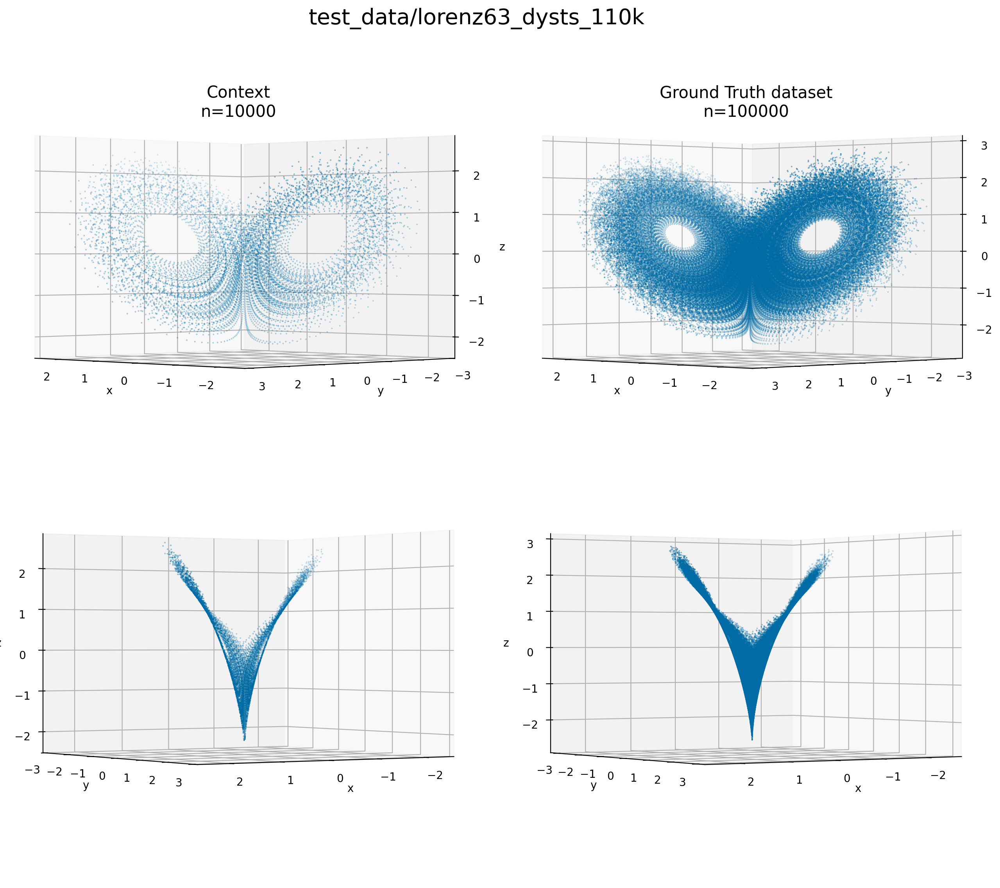

In [7]:
A, B = 2, 2
fig, axs = plt.subplots(B, A, figsize=(A*8, B*8), 
                        subplot_kw={'projection':'3d'},
                        gridspec_kw={'wspace': 0.1, 'hspace': -0.3},)
fig.suptitle(f"{gt_file_name}", fontsize=20, y=0.85)

for b in range(B):
    azim = 135  if b == 0 else  57
    for a in range(A):
        ax = axs[b, a]
        if b == 0:
            title = f"Context\nn={CL}"  if a == 0 else  f"Ground Truth dataset\nn={GTL}"
            ax.set_title(title, fontsize=15, y = 0.85)
        ax.view_init(elev=0, azim=azim, roll=0)
        ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
        data = c_sim  if a == 0 else gt_sim
        ax.scatter(*data.T, s=0.05)

plt.show()

#### Create or load the prediction

##### for `forecast_posterior()`

In [6]:
new_prediction = False   # if False, tries to load saved predictions from file

pred_file_name = "predictions/lorenz63_sim10k_att_noise"
if not new_prediction:   # Load prediction
    prediction = np.load(f"{pred_file_name}.npz").values()
    with open(f"{pred_file_name}.json") as f:
        pred_metadata = json.load(f)
    T, B, prior_size = [pred_metadata.get(key) 
        for key in ["dataset size", "batch size", "delta ball size"]]

else:   # Create & save new prediction
    # Parameters
    T = 10_000   # time horizon = length of prediction
    B = 100   # batch size = number of posterior samples to compute in parallel
    prior_size = 0.000   # size of the delta ball (gaussian in x-space)
    context = c_st
    noisy_forecast=False   # if True, use prior noise in prediction
    attention_noise=True    # if True, use attention noise in prediction
    
    # Create & save metadata
    pred_metadata = {
        'file name':f'{pred_file_name}.npz',
        'forecaster method':'forecast_posterior',
        'context':f"n={CL}, from '{gt_file_name}'",
        'dataset size':T, 
        'batch size':B, 
        'delta ball size':prior_size,
        'use prior noise':noisy_forecast,
        'use attention noise':attention_noise,
    }
    with open(f"{pred_file_name}.json", "w") as f:
        json.dump(pred_metadata, f, indent=4)

    # Create & save prediction
    forecast = forecaster.forecast_posterior(context=c_st, horizon=T, 
        num_samples=B, prior_size=prior_size, noisy_forecast=noisy_forecast, 
        attention_noise=attention_noise)
    prediction = [tensor.detach().numpy()  for tensor in forecast]
    np.savez(f"{pred_file_name}.npz", *prediction)


# Postprocess prediction data  
Z_prior, Z_post, X_prior, X_post = prediction
print([array.shape for array in prediction])
print(json.dumps(pred_metadata, indent=4))

[(10000, 100, 30), (10000, 100, 30), (10000, 100, 3), (10000, 100, 3)]
{
    "file name": "predictions/lorenz63_sim10k_att_noise.npz",
    "forecaster method": "forecast_posterior",
    "context": "n=10000, from 'test_data/lorenz63_dysts_110k'",
    "dataset size": 10000,
    "batch size": 100,
    "delta ball size": 0.0,
    "use prior noise": false,
    "use attention noise": true
}


##### for `forecast_att_post()`

In [5]:
new_prediction = False   # if False, tries to load saved predictions from file

pred_file_name = "predictions/lorenz63_sim_noisy_att_post"
if not new_prediction:   # Load prediction
    prediction = np.load(f"{pred_file_name}.npz").values()
    with open(f"{pred_file_name}.json") as f:
        pred_metadata = json.load(f)
    T, B, force_median, att_noise = [pred_metadata.get(key)  for key in 
        ["dataset size", "batch size", "force median", "attention noise"]]

else:   # Create & save new prediction
    # Parameters
    T = 10_000   # time horizon = length of prediction
    B = 10   # batch size = number of posterior samples to compute in parallel
    context = c_st
    force_median = False   # bool, default False
    att_noise = False   # bool, default True
    
    # Create & save metadata
    pred_metadata = {
        'file name':f'{pred_file_name}.npz',
        'forecaster method':'forecast_att_post',
        'context':f"n={CL}, from '{gt_file_name}'",
        'dataset size':T, 
        'batch size':B,
        'force median':force_median,
        'attention noise':att_noise,
    }
    with open(f"{pred_file_name}.json", "w") as f:
        json.dump(pred_metadata, f, indent=4)

    # Create & save prediction
    forecast = forecaster.forecast_att_post(c_st, T, B, force_median, att_noise)
    prediction = [tensor.detach().numpy()  for tensor in forecast]
    np.savez(f"{pred_file_name}.npz", *prediction)  


# Postprocess prediction data  
Z, raw_att_noise = prediction
print([array.shape for array in prediction])
print(json.dumps(pred_metadata, indent=4))

ValueError: too many values to unpack (expected 2)

## Experiments

### Investigeting how a Dynamix step works internally

#### Is noise still important with a good context?

In [44]:
ctx_file = "test_data/lorenz63_dysts_best_10k_context.npy"
context = np.load(ctx_file)
T, B, N = 100_000, 20, 3
ctx_batch = context[:, None].repeat(B, axis=1)
raw_noise = np.random.normal(size=(T, B, N))
raw_noise[:, 0] = 0

In [45]:
Z = forecaster.forecast_att_post2(T, ctx_batch, att_noise=raw_noise).detach().numpy()
X = Z[:,:,:3] * context.std(axis=0) + context.mean(axis=0)   # unstandardize Z-data to GT standard.

100%|██████████████████████████████████| 100000/100000 [05:24<00:00, 307.76it/s]


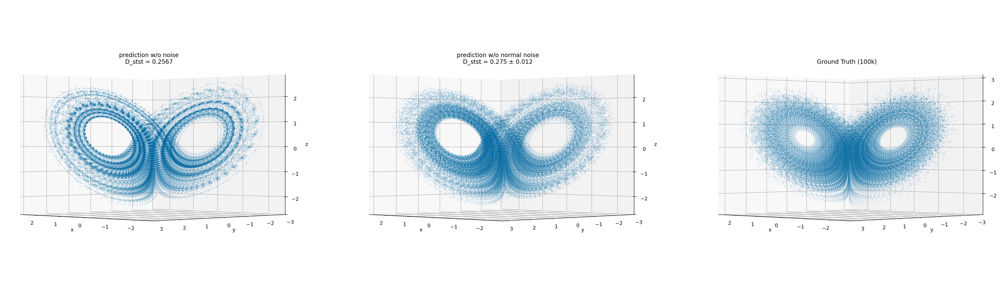

In [47]:
fig=plt.figure(figsize=(36, 12))
#fig.suptitle("Example of the big foracasting data set")

#T_plt = 100
ax = fig.add_subplot(1, 3, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.set_title(f"prediction w/o noise\nD_stst = {D_stst(gt_sim, X[:,0]):.4}", y=0.85)
#ax.scatter(*gt_sim.T, s=1, alpha=0.1, label="ground truth")
ax.scatter(*X[:,0].T, s=1, alpha=0.1, label="prediction")

dists = np.array([D_stst(gt_sim, X[:, i])  for i in range(1, B)])
ax = fig.add_subplot(1, 3, 2, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.set_title(f"prediction w/o normal noise\nD_stst = {dists.mean():.3} ± {dists.std():.2}", y=0.85)
#ax.scatter(*gt_sim.T, s=1, alpha=0.1)
ax.scatter(*X[:, 1].T, s=1, alpha=0.1)

ax = fig.add_subplot(1, 3, 3, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.set_title(f"Ground Truth (100k)", y=0.85)
ax.scatter(*gt_sim.T, s=1, alpha=0.1)

#plt.legend()
plt.show()

In [25]:
n = 100
print(f"{D_stst(gt_sim, X_noiseless, n_bins=n):.4}, {D_stst(gt_sim, X_noiseless, n_bins=n):.4}")

1.761, 1.761


In [57]:
N = 21
dists = np.zeros((N, B))
ns = np.logspace(1, 3, N, dtype=int)
print(ns)
for n in range(N):
    for b in range(B):
        dists[n, b] = D_stst(gt_sim, X[:, b], n_bins=n)

[  10   12   15   19   25   31   39   50   63   79  100  125  158  199
  251  316  398  501  630  794 1000]


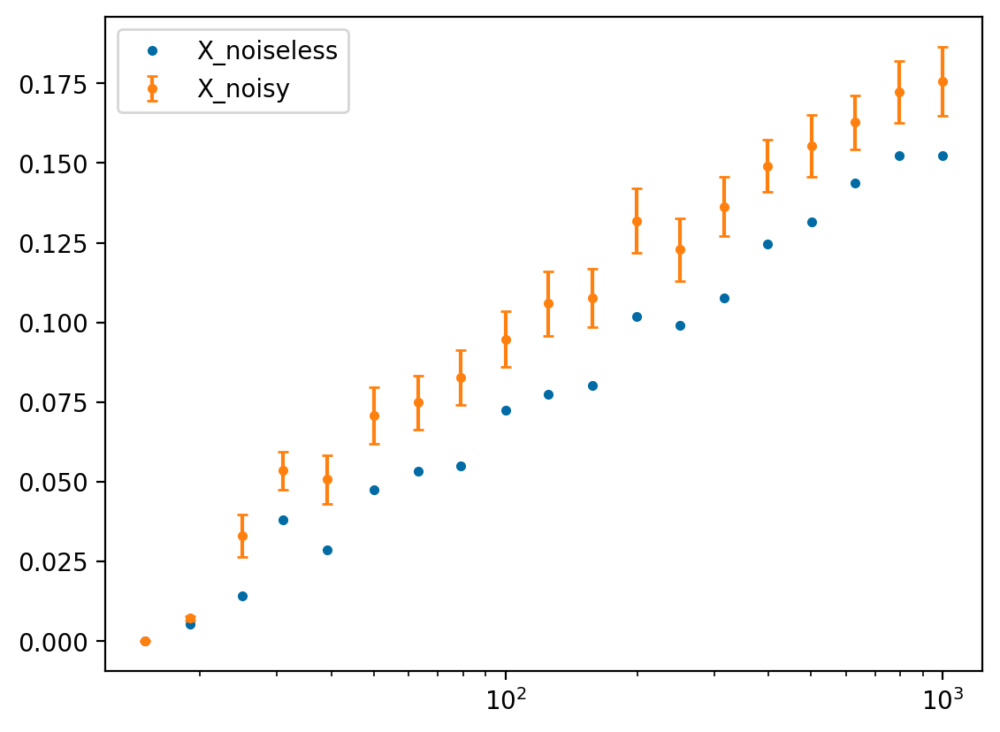

In [77]:
plt.plot(ns, dists[:,0], '.', label="X_noiseless")
plt.errorbar(ns, dists[:,1:].mean(axis=1), dists[:,1:].std(axis=1), fmt='.', capsize=2, label="X_noisy")
plt.xscale('log')
plt.legend()
plt.show()

#### Attempting to recreate a more efficient prediction pipeline

In [53]:
import torch.nn.functional as F
#import torch
#import numpy as np
#from tqdm import tqdm
#from src.model.preprocessing import DataPreprocessor
# also assumes Dynamix `model` to already be loaded.
    #from src.utilities.utilities import load_hf_model
    #model = load_hf_model("dynamix-3d-alrnn-v1.0")
    #model.eval()


@torch.no_grad()
def dynamix_forecast (T, context, start_point=None, raw_noise=None) :
    '''
    efficient implementation of DynamixForecaster.forecast_att_noise2()
    
    Arguments:
    T : int, >= 1, T = number of prediction steps
    context : np.array or torch.Tensor, shape=(Tc, B, N)
        Tc = context length (in time steps), B = batch size, N = data dimension
    start_point : None or (np.array or torch.Tensor, shape=(B, N))
    raw_noise : np.array or torch.Tensor, shape=(T, B, N)

    Returns:
    X : np.array or torch.Tensor, shape=(T+1, B, N)
        T+1 = all prediction steps + start_point
    '''

    
    # Data preprocessing
    ## Load model parameters and make other abbreviations
    M, N = model.M, model.N   # model dimensions: M=30, N=3
    model_dtype = next(model.parameters()).dtype
    tensor = lambda array : torch.tensor(array, dtype=model_dtype)
    isNone = lambda var : type(var) == type(None)
    preprocess = DataPreprocessor().preprocess
    GN = model.gating_network
    attention_temp = torch.abs(GN.softmax_temp1[0])   # float
    expert_temp = torch.abs(GN.softmax_temp2[0])  # float
    B = context.shape[1]   # int, batch size
    E = model.Experts   # = 10
    
    ## Extract the individual expert parameters to process them in parallel instead of sequentially.
    expert_A = torch.zeros((E, M)); expert_W = torch.zeros((E, M, M)); expert_h = torch.zeros((E, M))
    for e in range(E):
        expert_A[e] = model.experts[e].A; expert_W[e] = model.experts[e].W; expert_h[e] = model.experts[e].h
    
    ## Preprocess context and start_point
    ctx_std, ctx_mean = context.std(axis=0), context.mean(axis=0)
    ctx_stdzd = (context - ctx_mean) / ctx_std   # 'context standardized'
    start = ctx_stdzd[-1]  if isNone(start_point) else  (context - ctx_mean) / ctx_std   # 'start point'
    context_embedded, initial_condition = preprocess(tensor(ctx_stdzd), N, tensor(start))   # (Tc, B, N), (B, N)
    precomputed_cnn = model.precompute_cnn(context_embedded)   # (Tc-1, B, N)
    
    ## Create output and noise tensors
    Z = torch.zeros(T+1, B, M)
    Z[0] = torch.einsum('bn, nm -> bm', initial_condition, model.B)   # (B, M)
    raw_noise = torch.randn((T, B, N), dtype=model_dtype)  if isNone(raw_noise) else  tensor(raw_noise)
        # noise source for the attention noise in the Gating Network

    
    # Run prediction loop
    for t in tqdm(range(T)):
        # ALRNN: Compute individual expert outputs
        z_relu = Z[t].clone(); F.relu_(z_relu[-model.P:])   # (B, M), do a ReLU operation only on the last P feature dim.s of Z[t]
        expert_outputs = torch.einsum('em, bm -> ebm', expert_A, Z[t]) \
            + torch.einsum('emi, bi -> ebm', expert_W, z_relu) \
            + expert_h[:, None]   # (E, B, M)
        
        # Gating Network: Compute expert weights
        ## Add attention noise to current position x
        x_att = torch.einsum('bm, nm -> bn', Z[t], GN.D)   # (B, N)
        att_noise = GN.sigma * raw_noise[t]   # (B, N)
        x_att_noisy = x_att + att_noise   # (B, N)
        
        ## CNN: Build weighted embedding of relevant context
        att_distances = torch.sum(torch.abs(context_embedded[:-1] - x_att_noisy[None]), dim=2)  # (Tc-1, B)
        attention_weights = F.softmax(- att_distances / attention_temp, dim=0)   # (Tc-1, B)
        embedding = torch.einsum('cbn, cb -> bn', precomputed_cnn, attention_weights)  # (B, N)
        
        ## MLP: Compute expert weights from current z and the embedding
        combined = torch.cat([embedding, Z[t]], dim=1)   # (B, N+M)
        mlp_output = GN.mlp_layer2(F.relu(GN.mlp_layer1(combined)))   # (B, E)
        expert_weights = F.softmax(- mlp_output.T / expert_temp, dim=0)  # (E, B)
          
        # Prediction: Combine expert outputs
        Z[t+1] = torch.einsum('ebm, eb -> bm', expert_outputs, expert_weights)  # (B, M)

    
    # Output: Return predicted positions
    X = Z[:,:, :N]   # (T+1, B, N)
    if type(context) == np.ndarray:  X = X.detach().cpu().numpy()
    X = X * ctx_std + ctx_mean   # unstandardize
    return X

In [83]:
ctx_file = "test_data/lorenz63_dysts_best_10k_context.npy"
context = np.load(ctx_file)
T, B, N = 1000, 1000, 3
raw_noise = np.random.normal(size=(T, B, N))

In [84]:
ctx_batch = context[:, None].repeat(B, axis=1)
print(ctx_batch.shape, raw_noise.shape)

(10000, 1000, 3) (1000, 1000, 3)


In [85]:
X = dynamix_forecast(T, ctx_batch, raw_noise=raw_noise)

100%|███████████████████████████████████████| 1000/1000 [02:38<00:00,  6.32it/s]


In [86]:
X2 = forecaster.forecast_att_post2(T, ctx_batch, att_noise=raw_noise)

100%|███████████████████████████████████████| 1000/1000 [03:18<00:00,  5.03it/s]


In [73]:
# code snippet from https://realpython.com/python-timer/#creating-a-python-timer-decorator
import functools
import time

def timer(func):
    @functools.wraps(func)
    def wrapper_timer(*args, **kwargs):
        tic = time.perf_counter()
        value = func(*args, **kwargs)
        toc = time.perf_counter()
        elapsed_time = toc - tic
        print(f"Elapsed time: {elapsed_time:0.4f} seconds")
        return value
    return wrapper_timer

In [87]:
forecaster.forecast = timer(forecaster.forecast)
X3 = forecaster.forecast(ctx_batch, T)

Elapsed time: 206.8631 seconds
Elapsed time: 206.8632 seconds
Elapsed time: 206.8632 seconds


#### Taking apart the dynamix prediction pipeline to investigate it

##### Context & Initial condition

In [8]:
ctx_file = "test_data/lorenz63_dysts_best_10k_context.npy"
context = np.load(ctx_file)
ctx_std = context.std(axis=0)
ctx_mean = context.mean(axis=0)
ctx_stdzd = (context - ctx_mean) / ctx_std   # 'context standardized'
ic = ctx_stdzd[-1]   # 'initial condition'

In [9]:
print(ctx_std, ctx_mean)
print(ctx_stdzd.std(axis=0), ctx_stdzd.mean(axis=0))
print(ic)

[0.99717737 0.99781943 0.99791921] [-0.05098888 -0.04481139  0.00230985]
[1. 1. 1.] [-9.25926003e-17 -4.20413704e-17  3.37563311e-17]
[-0.46122974 -0.10384707  0.32125305]


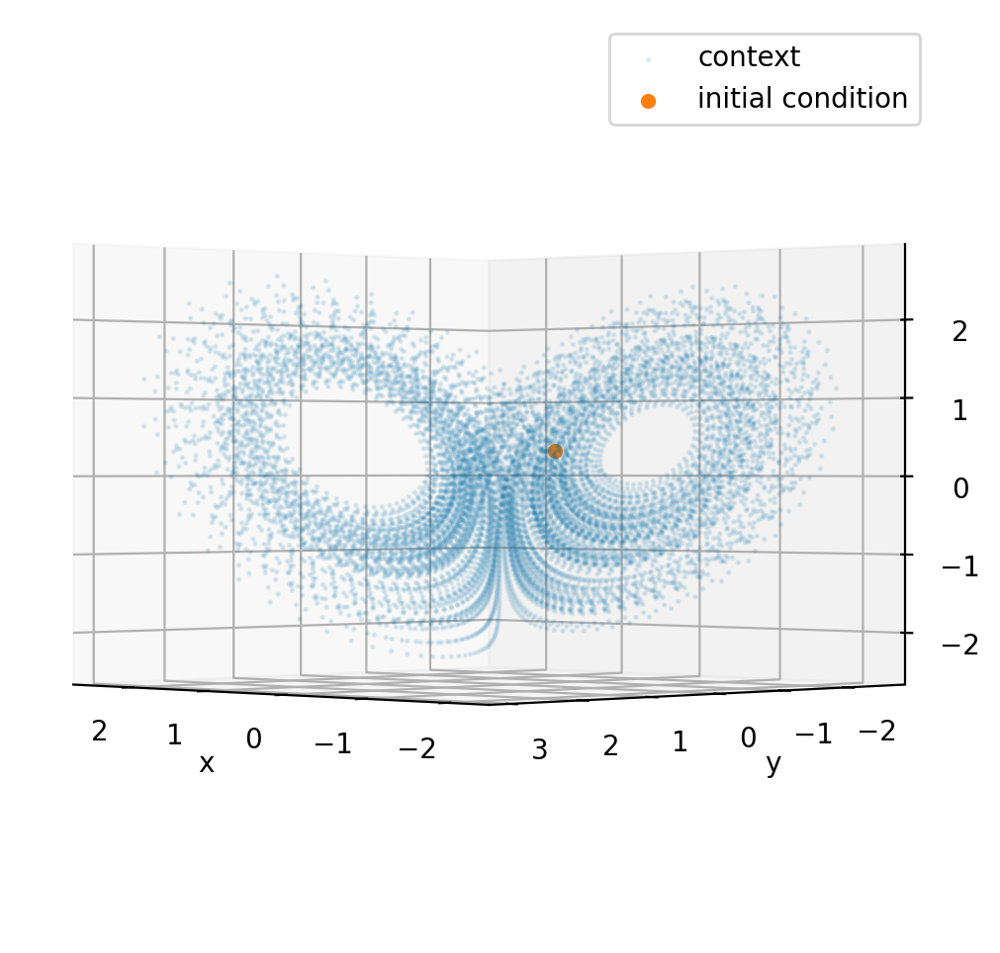

In [10]:
fig=plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.scatter(*ctx_stdzd.T, s=1, alpha=0.1, label='context')
ax.scatter(*ic, label='initial condition')
plt.legend()
plt.show()

##### Preprocessing

In [11]:
M, N = model.M, model.N   # model dim.s: M=30, N=3
model_dtype = next(model.parameters()).dtype

context_torch = torch.tensor(ctx_stdzd[:,None], dtype=model_dtype)
ic_torch      = torch.tensor(ic[None], dtype=model_dtype)
context_embedded, initial_condition = DataPreprocessor().preprocess(context_torch, N, ic_torch)
print(context_embedded.shape, initial_condition.shape)

torch.Size([10000, 1, 3]) torch.Size([1, 3])


In [7]:
T = 1; B = 1
Z = torch.zeros(T+1, M, B)
Z[0] = torch.einsum('bn, nm -> mb', initial_condition, model.B)   # (M, B)

In [8]:
raw_noise = torch.randn((T, N, B), dtype=model_dtype)

In [9]:
precomputed_cnn = model.precompute_cnn(context_embedded)   # (Tc-1, B, N)

##### Gating Network

In [10]:
import torch.nn.functional as F
GN = model.gating_network
t = 0

In [11]:
x_att = torch.einsum('mb, nm -> nb', Z[t], GN.D)   # (N, B)
att_noise = GN.sigma[:, None] * raw_noise[t]   # (N, B)
x_att_noisy = x_att + att_noise   # (N, B)

In [12]:
# Compute attention weights
att_distances = torch.sum(torch.abs(context_embedded[:-1] - x_att_noisy.T[None]), dim=2)  # (Tc-1, B)
attention_weights = F.softmax(
    -att_distances / torch.abs(GN.softmax_temp1[0]), dim=0)   # (Tc-1, B)

In [13]:
# Build weighted embedding
weighted_cnn = precomputed_cnn * attention_weights[:,:,None]   # (Tc-1, B, N)
embedding = torch.sum(weighted_cnn, dim=0)   # (B, N)

##### Experts

In [36]:
# Extracting the individual expert parameters to process them in parallel instead of sequentially.
E = model.Experts   # = 10
expert_A = torch.zeros((E, M))
expert_W = torch.zeros((E, M, M))
expert_h = torch.zeros((E, M))
for e in range(E):
    expert_A[e] = model.experts[e].A
    expert_W[e] = model.experts[e].W
    expert_h[e] = model.experts[e].h

In [37]:
# Predict expert weights
combined = torch.cat([embedding, Z[t].T], dim=1)   # (B, N+M)
mlp_output = GN.mlp_layer2(F.relu(GN.mlp_layer1(combined)))   # (B, E), E = 10 = number of experts
w_exp = F.softmax(-mlp_output.T / torch.abs(GN.softmax_temp2[0]), dim=0)  # (E, B)

In [38]:
#results = torch.zeros((E, M, B))
#for e in range(E):
#    results[e] = model.experts[e](Z[t])

# Compute expert outputs
z_relu = Z[t].clone()
F.relu_(z_relu[-model.P:])
expert_outputs = expert_A[:,:,None] * Z[t] + expert_W @ z_relu + expert_h[:,:,None]   # (E, M, B)

# combine expert outputs
Z[t+1] = torch.sum(expert_outputs * w_exp[:,None], dim=0)   # (M, B)

### Correlating prediction noise with prediction accuracy

In [3]:
# Load and postprocess forecasting dataset
forecasting_dict = np.load(f"predictions/lorenz63_big_forecasting_dataset.npz")
f_keys, f_values = list(forecasting_dict.keys()), list(forecasting_dict.values())
for key, value in zip(f_keys, f_values):
    print(f"{key}: {value.shape}")

initial_conditions, gt_tracks, context, Z_Data, Att_Noise = f_values
X_Data = Z_Data[...,:3] * context.std() + context.mean()   # unstandardize Z-data to GT standard.
print(f"X_Data: {X_Data.shape}")

initial_conditions: (1000, 3)
gt_tracks: (1000, 200, 3)
context: (10000, 3)
Z_Data: (1000, 200, 300, 30)
attention_noise: (1000, 200, 300, 3)
X_Data: (1000, 200, 300, 3)


In [4]:
np.savez(f"predictions/lorenz63_forecasting_dataset.npz", 
         initial_conditions=initial_conditions, 
         gt_tracks=gt_tracks, context=context,
        X_Data=X_Data)

In [3]:
S, T, B, D = X_Data.shape
Tp = T-1   # needed for comparing X to GT (X starts at t=1 but GT at t=0)

##### For "Correlating PDU..." and earlier sections

In [4]:
# Computing the distance of each prediction thread to GT
gt_batch = gt_tracks[:,1:, None].repeat(B, axis=2)   # (1000, 199, 300, 3) == X_Data.shape
distances_to_gt = np.linalg.norm(X_Data[:,:-1] - gt_batch, axis=-1)   # (1000, 199, 300)
mean_dist_to_gt = distances_to_gt.mean(axis=-1)   # (1000, 199)

In [5]:
# Computing the prediction "uncertainty" as the volume of each time step batch's std.dev. ellipsoid (n=300)
pred_unc = np.zeros((S, Tp))
for n in range(S):
    for t in range(Tp):
        pred_unc[n, t] = np.log(np.sqrt(np.linalg.det(np.cov(X_Data[n, t].T))))
DPU_radius = np.exp(pred_unc)**(1/3)

In [6]:
# Computing change in prediction "uncertainty" and in distance to GT
d_dist_to_gt = mean_dist_to_gt[1:] - mean_dist_to_gt[:-1]
d_pred_unc   = pred_unc[1:] - pred_unc[:-1]

#### Checking out Partial correlations

In [24]:
corr = lambda x, y : pearsonr(x, y).statistic

def partial_corr (X, Y, Z) :
    corr_XY, corr_XZ, corr_YZ = corr(X, Y), corr(X, Z), corr(Y, Z)
    
    return (corr_XY - corr_XZ * corr_YZ) / (np.sqrt(1 - corr_XZ**2) * np.sqrt(1 - corr_YZ**2))

print_max = lambda x: print(f"{x.max():.2f} @ {x.argmax()}")

In [28]:
# dyn_dist: Dynamix distance to GT (formerly called GTD)
gt_batch = gt_tracks[:,1:, None].repeat(B, axis=2)   # (1000, 199, 300, 3) == X_Data.shape
distances_to_gt = np.linalg.norm(X_Data[:,:-1] - gt_batch, axis=-1)   # (1000, 199, 300)
dyn_dist = distances_to_gt.mean(axis=-1)   # (1000, 199)

# dyn_div: Dynamix 'divergence' (mean distance of each batch point to batch center. formerly called DPU_dist)
batch_centers = X_Data.mean(axis=2, keepdims=True)   # (1000, 200, 1)
dyn_div = np.linalg.norm(X_Data - batch_centers, axis=-1).mean(axis=2)[:, :-1]   # (1000, 199)

# gt_speed: GT speed (GT[t] - GT[t-1]. formely 'speed')
gt_speed = np.linalg.norm(gt_tracks[:, 1:] - gt_tracks[:, :-1], axis=-1)   # (1000, 199)

In [30]:
# gt_div: GT 'divergence' (mean distance of each 'batch' point to the central track. formerly 'gt_divergences')

gamma = 0.03   # radius of proximity ball around track start points (initial conditions)
gt_div = np.zeros((S, T))   # (1000, 200)

# find gamma-ball 'batches' around each GT track start point.
prox_ball_idxs = []   # list for each 'batch': indices of every 'batch' point
ic_idxs = np.zeros(S, dtype=int)   # indices of every track start point / initial condition
GT = gt_tracks.reshape(-1, 3)   # (200k, 3)
for s in tqdm(range(S)):
    # find other GT points within gamma radius of the IC
    ic_dists = np.linalg.norm(GT - initial_conditions[s, None], axis=-1)   # (200k)
    mask = ic_dists < gamma

    # select only those belonging to different tracks
    idxs = np.argwhere(mask).flatten()
    didxs = idxs[1:] - idxs[:-1]
    dmask = didxs > T
    dm_idxs = np.argwhere(dmask).flatten()
    dm_idxs = np.concatenate((np.zeros(1, dtype=int), dm_idxs+1), axis=0)
    pb_idxs = idxs[dm_idxs]  # 'proximity ball indices'

    # save those indices
    prox_ball_idxs.append(pb_idxs)   # add 'batch' point indices to list
    ic_idxs[s] = np.argwhere(ic_dists == 0)[0,0]  # add track start point index

# calculate gt_div for each 'batch' (each track and timestep)
for s in tqdm(range(S)):
    pb_idxs = prox_ball_idxs[s]
    pb_idxs = pb_idxs[pb_idxs < S*T - T]   # filter out indices at the very end of the dataset
    for t in range(T):
        points = GT[pb_idxs+t]
        ic_track = GT[ic_idxs[s]+t]
        gt_div[s, t] = np.linalg.norm(points - ic_track[None], axis=-1).mean()

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 511.70it/s]


In [32]:
print(dyn_div.shape, gt_div.shape)

(1000, 199) (1000, 200)


In [38]:
print_max(corr(dyn_div, gt_div[:, 1:]))
print_max(corr(dyn_div, dyn_dist))
print_max(corr(dyn_div, speed))
print()
print_max(corr(dyn_dist, gt_div[:, 1:]))
print_max(corr(dyn_dist, speed))
print()
print_max(corr(gt_div[:, 1:], speed))

0.93 @ 35
0.90 @ 40
0.79 @ 5

0.86 @ 37
0.73 @ 58

0.62 @ 196


In [41]:
print_max(partial_corr(dyn_div, gt_div[:, 1:], speed))
print_max(partial_corr(dyn_div, dyn_dist, speed))
print_max(partial_corr(dyn_dist, gt_div[:, 1:], speed))

0.92 @ 35
0.88 @ 40
0.84 @ 36


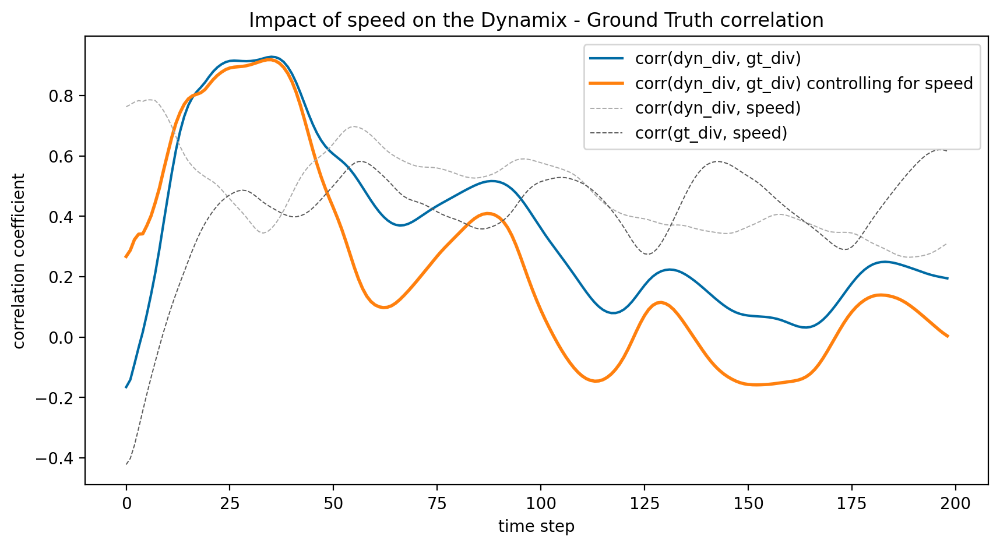

In [60]:
plt.figure(figsize=(10, 5))
plt.plot(corr(dyn_div, gt_div[:, 1:]), label="corr(dyn_div, gt_div)")
plt.plot(partial_corr(dyn_div, gt_div[:, 1:], speed), linewidth=2, label="corr(dyn_div, gt_div) controlling for speed")
plt.plot(corr(dyn_div, speed), '--', linewidth=0.7, label="corr(dyn_div, speed)")
plt.plot(corr(gt_div[:, 1:], speed), '--', linewidth=0.7, label="corr(gt_div, speed)")
plt.title("Impact of speed on the Dynamix - Ground Truth correlation")
plt.ylabel('correlation coefficient')
plt.xlabel('time step')
plt.legend()
plt.show()

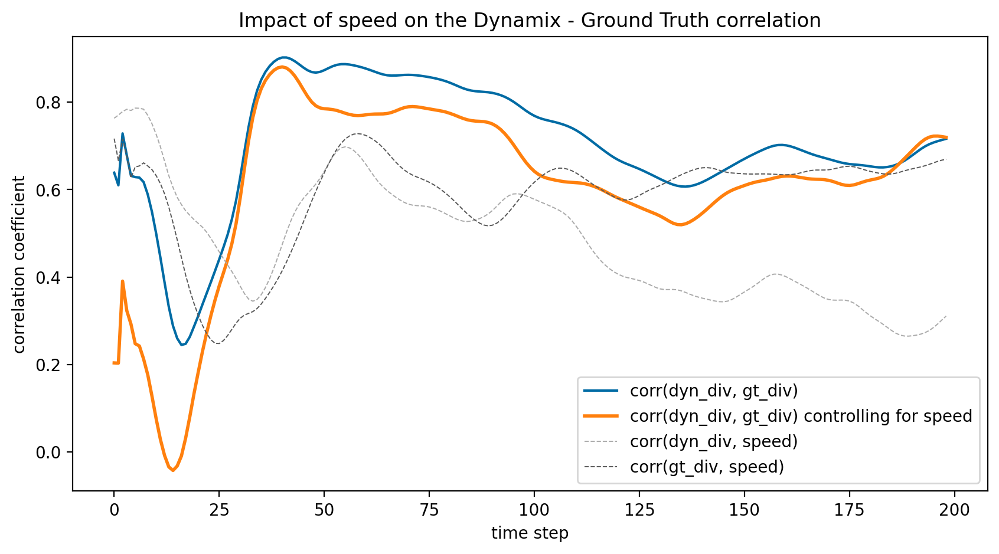

In [61]:
plt.figure(figsize=(10, 5))
plt.plot(corr(dyn_div, dyn_dist), label="corr(dyn_div, gt_div)")
plt.plot(partial_corr(dyn_div, dyn_dist, speed), linewidth=2, label="corr(dyn_div, gt_div) controlling for speed")
plt.plot(corr(dyn_div, speed), '--', linewidth=0.7, label="corr(dyn_div, speed)")
plt.plot(corr(dyn_dist, speed), '--', linewidth=0.7, label="corr(gt_div, speed)")
plt.title("Impact of speed on the Dynamix - Ground Truth correlation")
plt.ylabel('correlation coefficient')
plt.xlabel('time step')
plt.legend()
plt.show()

#### Correlating DPU (mean dist. to batch center) to GTD (mean dist. to GT)

In [7]:
batch_centers = X_Data.mean(axis=2, keepdims=True)
DPU_dist = np.linalg.norm(X_Data - batch_centers, axis=-1).mean(axis=2)

0.90 @ 40


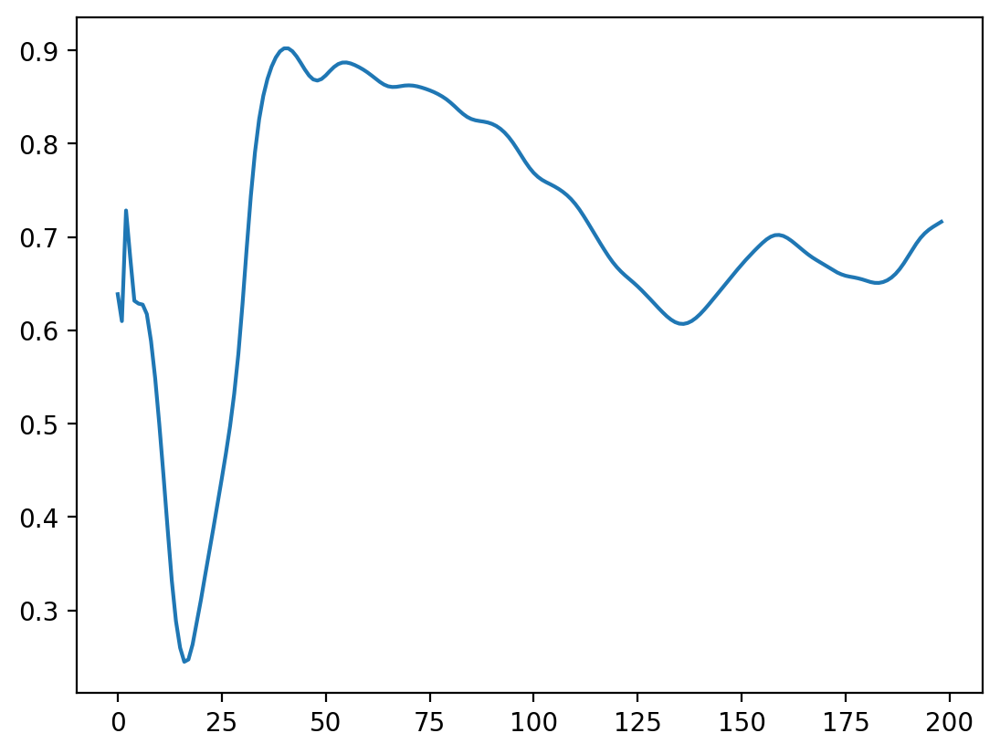

In [8]:
corr = np.zeros(Tp)
for t in range(Tp):
    corr[t] = pearsonr(mean_dist_to_gt[:, t], DPU_dist[:, t]).statistic
plt.plot(corr);
print(f"{corr.max():.2f} @ {corr.argmax()}")

0.55 @ 43
0.52 @ 40


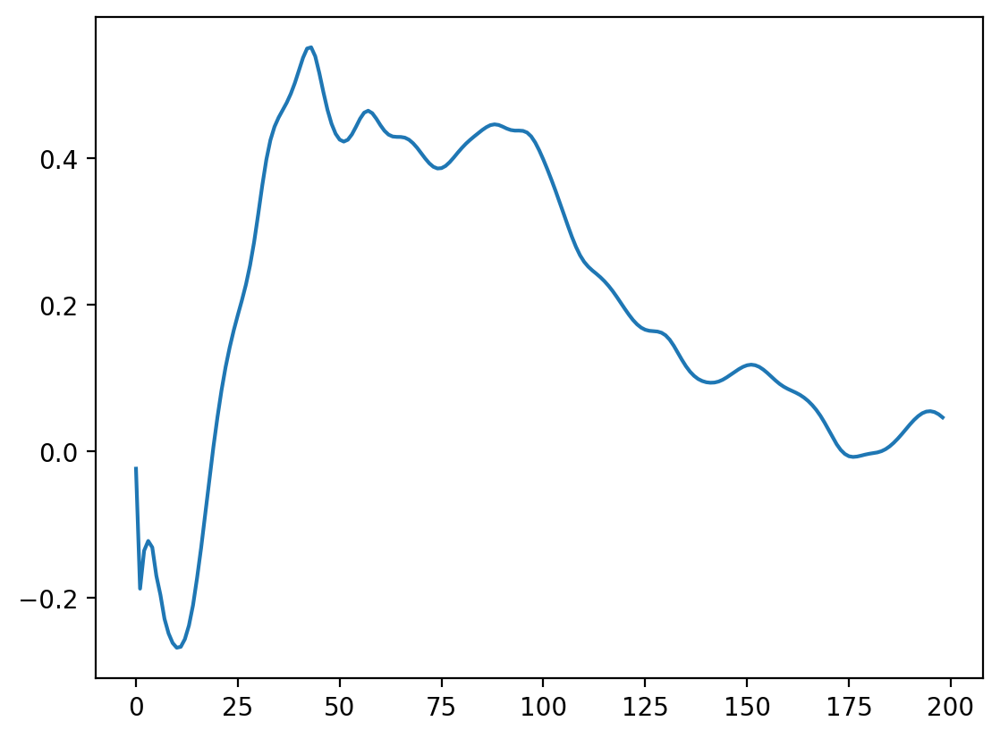

In [9]:
speed = np.linalg.norm(gt_tracks[:, 1:] - gt_tracks[:, :-1], axis=-1)
corr_no_speed = np.zeros(Tp)
for t in range(Tp):
    corr_no_speed[t] = pearsonr(mean_dist_to_gt[:, t], DPU_dist[:, t]/speed[:, t]).statistic
plt.plot(corr_no_speed);
print(f"{corr_no_speed.max():.2f} @ {corr_no_speed.argmax()}")
print(f"{corr_no_speed[40]:.2f} @ {40}")

100%|██████████████████████████████████████| 1000/1000 [00:04<00:00, 247.56it/s]


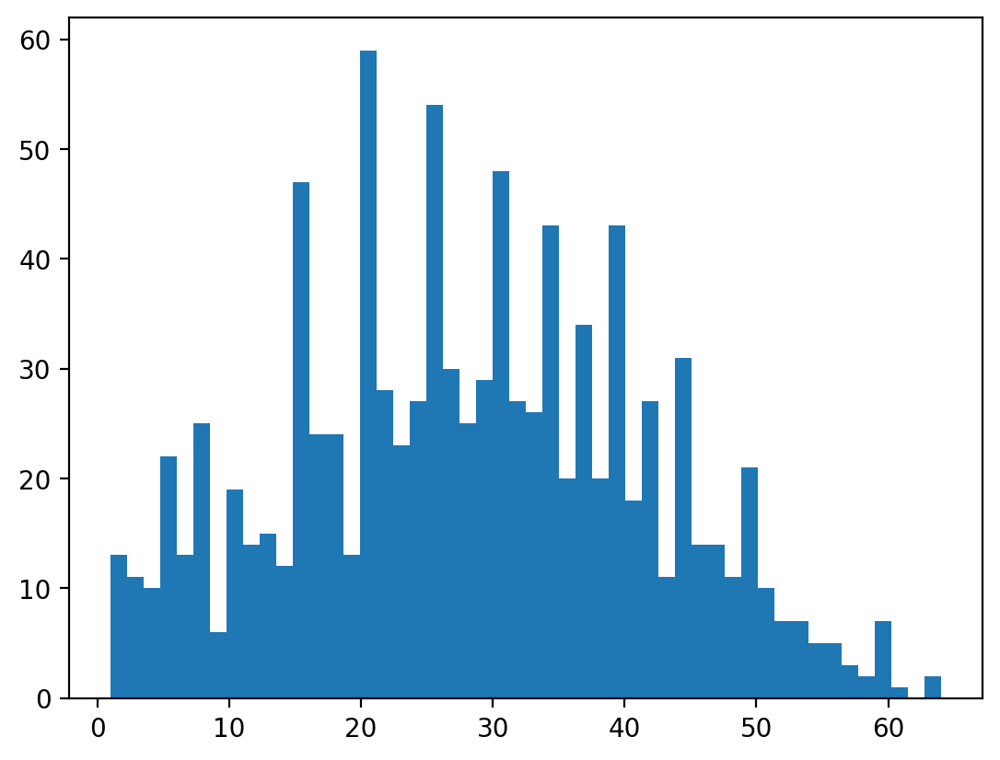

In [10]:
# Calculating GT divergence
GT = gt_tracks.reshape(-1, 3)   # (200k, 3)

vals = np.zeros(S)
diff = np.zeros(S)
prox_ball_idxs = []
ic_idxs = np.zeros(S, dtype=int)
gamma = 0.03   # radius of proximity ball around ICs
for s in tqdm(range(S)):
    # find other GT points within gamma radius of the IC
    ic_dists = np.linalg.norm(GT - initial_conditions[s, None], axis=-1)   # (200k)
    mask = ic_dists < gamma

    # select only those belonging to different tracks
    idxs = np.argwhere(mask).flatten()
    didxs = idxs[1:] - idxs[:-1]
    dmask = didxs > T
    dm_idxs = np.argwhere(dmask).flatten()
    dm_idxs = np.concatenate((np.zeros(1, dtype=int), dm_idxs+1), axis=0)
    pb_idxs = idxs[dm_idxs]  # 'proximity ball indices'
    
    vals[s] = np.sum(len(pb_idxs))
    diff[s] = len(pb_idxs) / len(idxs)
    prox_ball_idxs.append(pb_idxs)
    ic_idxs[s] = np.argwhere(ic_dists == 0)[0,0]
plt.hist(vals, bins=50);

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 501.95it/s]


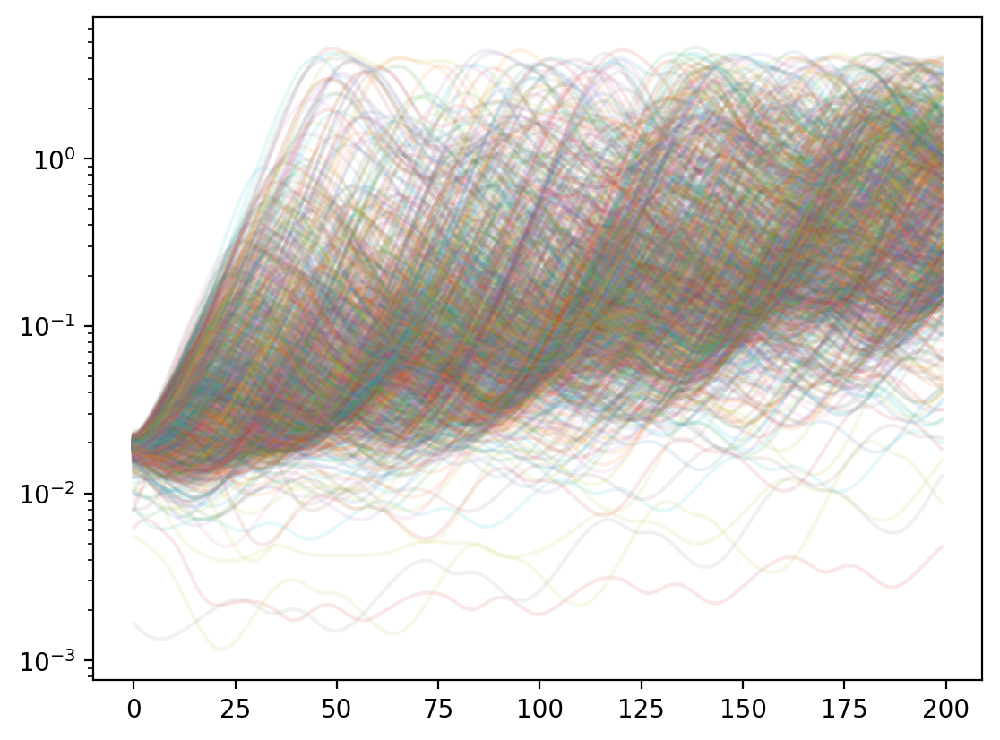

In [11]:
tl = T  # track length
gt_divergences = np.zeros((S, tl))
for s in tqdm(range(S)):
    pb_idxs = prox_ball_idxs[s]
    pb_idxs = pb_idxs[pb_idxs < S*T - tl]   # filter out indices at the very end of the dataset
    for t in range(tl):
        points = GT[pb_idxs+t]
        ic_track = GT[ic_idxs[s]+t]
        gt_divergences[s, t] = np.linalg.norm(points - ic_track[None], axis=-1).mean()
plt.plot(np.tile(np.arange(tl), (S, 1)).T, gt_divergences[:, :tl].T, alpha=0.1);#, s=1, alpha=0.1)
plt.yscale('log')

0.86 @ 37


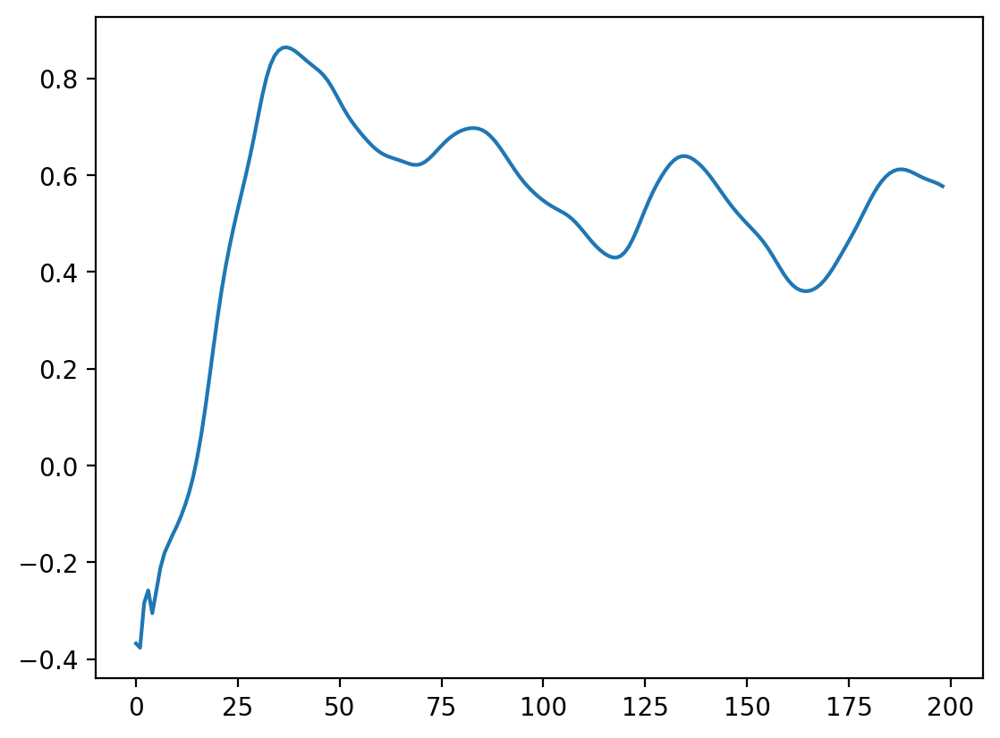

In [12]:
corr_gt_div = np.zeros(Tp)
for t in range(Tp):
    corr_gt_div[t] = pearsonr(mean_dist_to_gt[:, t], gt_divergences[:, t+1]).statistic
plt.plot(corr_gt_div);
print(f"{corr_gt_div.max():.2f} @ {corr_gt_div.argmax()}")

0.93 @ 35
0.92 @ 37


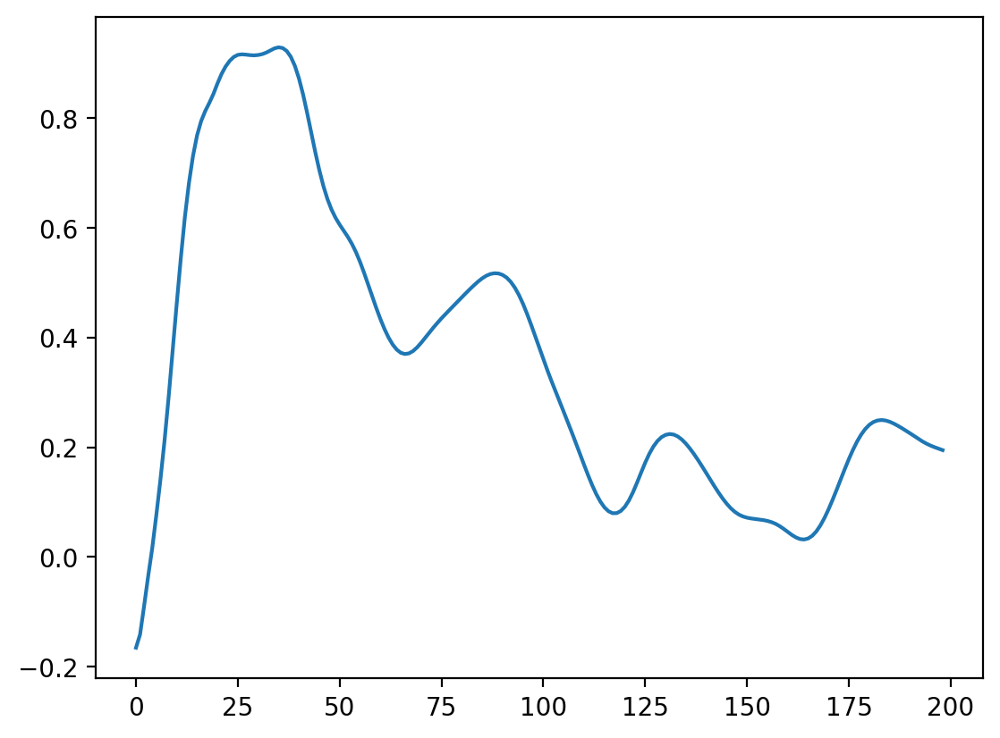

In [13]:
corr_gt_div = np.zeros(Tp)
for t in range(Tp):
    corr_gt_div[t] = pearsonr(gt_divergences[:, t+1], DPU_dist[:, t]).statistic
plt.plot(corr_gt_div);
print(f"{corr_gt_div.max():.2f} @ {corr_gt_div.argmax()}")
print(f"{corr_gt_div[37]:.2f} @ {37}")

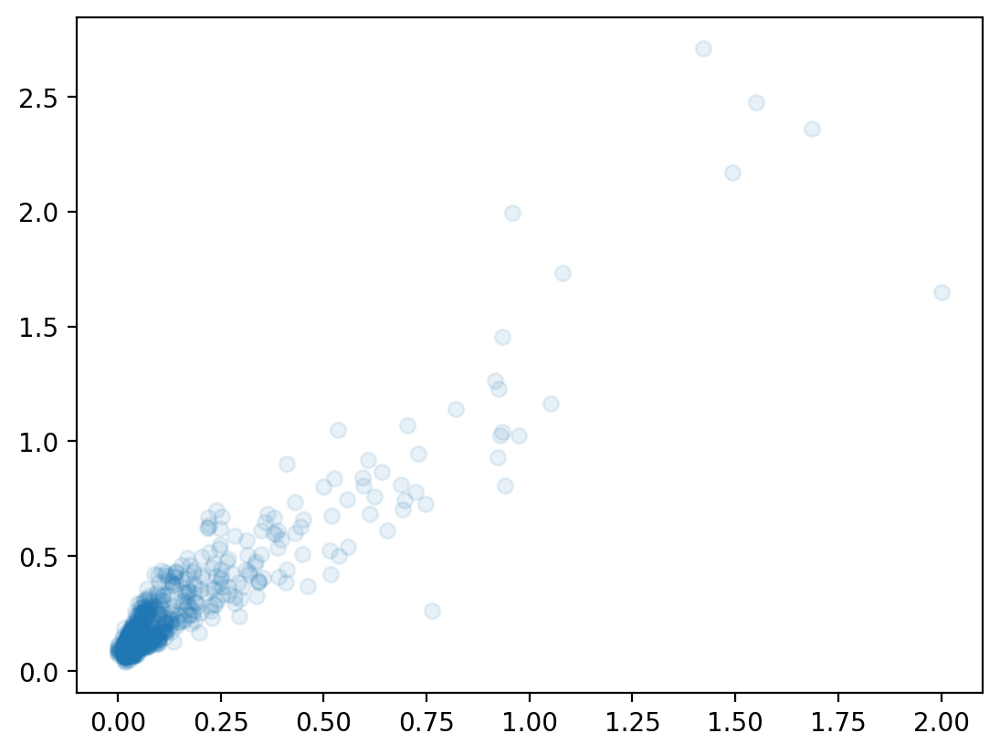

In [14]:
plt.scatter(gt_divergences[:, 36], DPU_dist[:, 35], alpha=0.1);

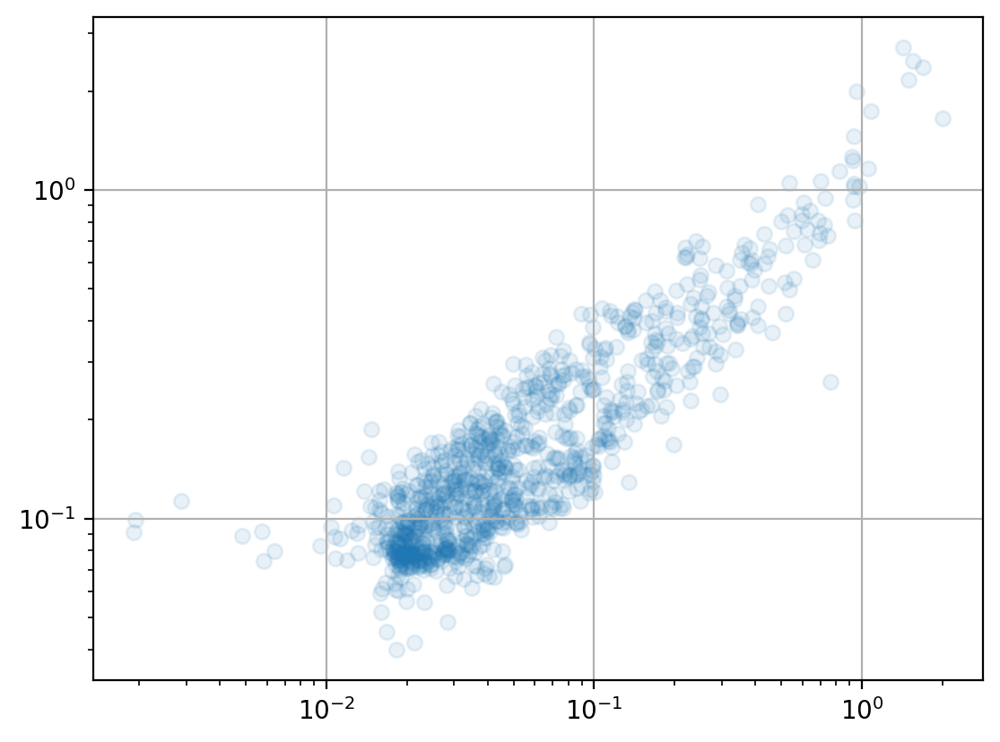

In [16]:
plt.xscale('log')
plt.yscale('log')
plt.grid()
plt.scatter(gt_divergences[:, 36], DPU_dist[:, 35], alpha=0.1);


##### Trying to measure GT divergence

In [7]:
GT = gt_tracks.reshape(-1, 3)
'''
fig=plt.figure(figsize=(7, 6))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*GT[:2000].T)
''';

100%|██████████████████████████████████████| 1000/1000 [00:06<00:00, 163.31it/s]


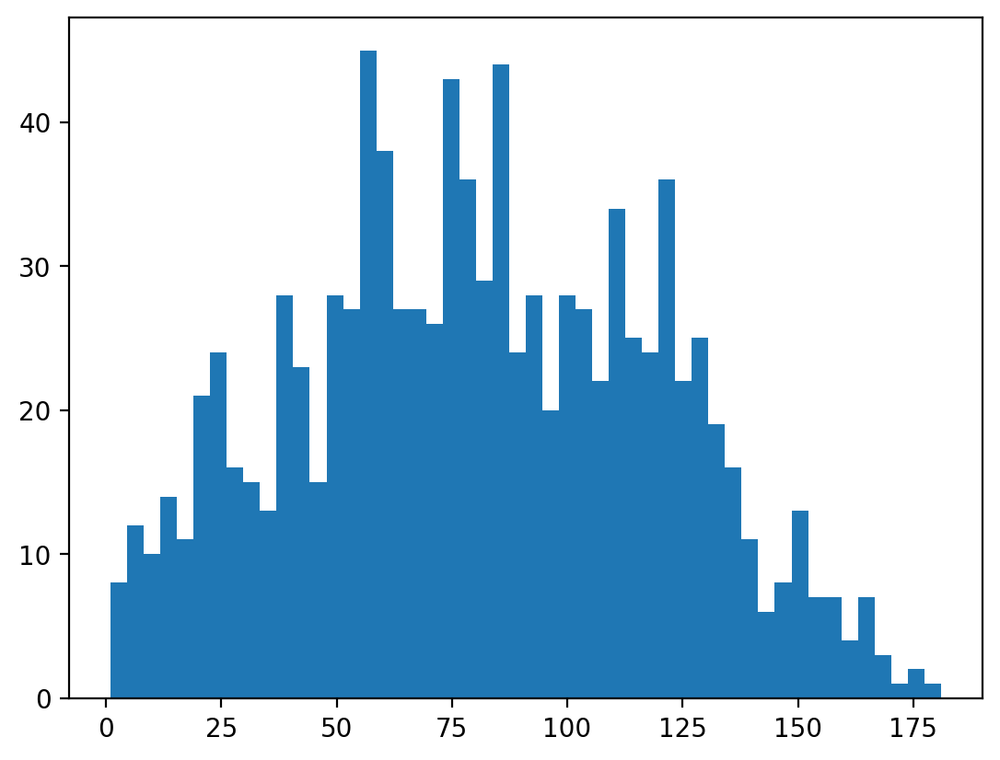

In [8]:
vals = np.zeros(S)
gamma = 0.05   # radius of proximity ball around ICs
for s in tqdm(range(S)):
    ic = initial_conditions[s, None, :].repeat(S*T, axis=0)   # (200k, 3)
    ic_dists = np.linalg.norm(GT - ic, axis=-1)   # (200k)
    mask = ic_dists < gamma
    vals[s] = np.sum(mask)
plt.hist(vals, bins=50);

100%|██████████████████████████████████████| 1000/1000 [00:07<00:00, 140.27it/s]


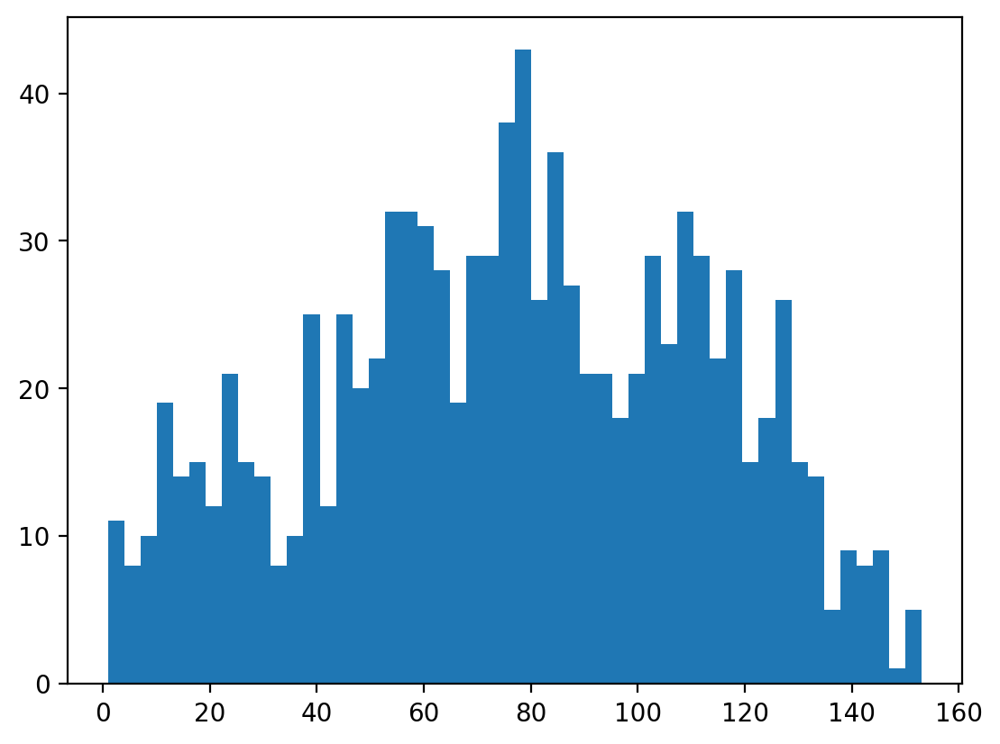

In [9]:
vals = np.zeros(S)
diff = np.zeros(S)
prox_ball_idxs = []
ic_idxs = np.zeros(S, dtype=int)
gamma = 0.05   # radius of proximity ball around ICs
for s in tqdm(range(S)):
    # find other GT points within gamma radius of the IC
    ic_dists = np.linalg.norm(GT - initial_conditions[s, None], axis=-1)   # (200k)
    mask = ic_dists < gamma

    # select only those belonging to different tracks
    idxs = np.argwhere(mask).flatten()
    didxs = idxs[1:] - idxs[:-1]
    dmask = didxs > 100
    dm_idxs = np.argwhere(dmask).flatten()
    dm_idxs = np.concatenate((np.zeros(1, dtype=int), dm_idxs+1), axis=0)
    pb_idxs = idxs[dm_idxs]  # 'proximity ball indices'
    
    vals[s] = np.sum(len(pb_idxs))
    diff[s] = len(pb_idxs) / len(idxs)
    prox_ball_idxs.append(pb_idxs)
    ic_idxs[s] = np.argwhere(ic_dists == 0)[0,0]

plt.hist(vals, bins=50);

0.947


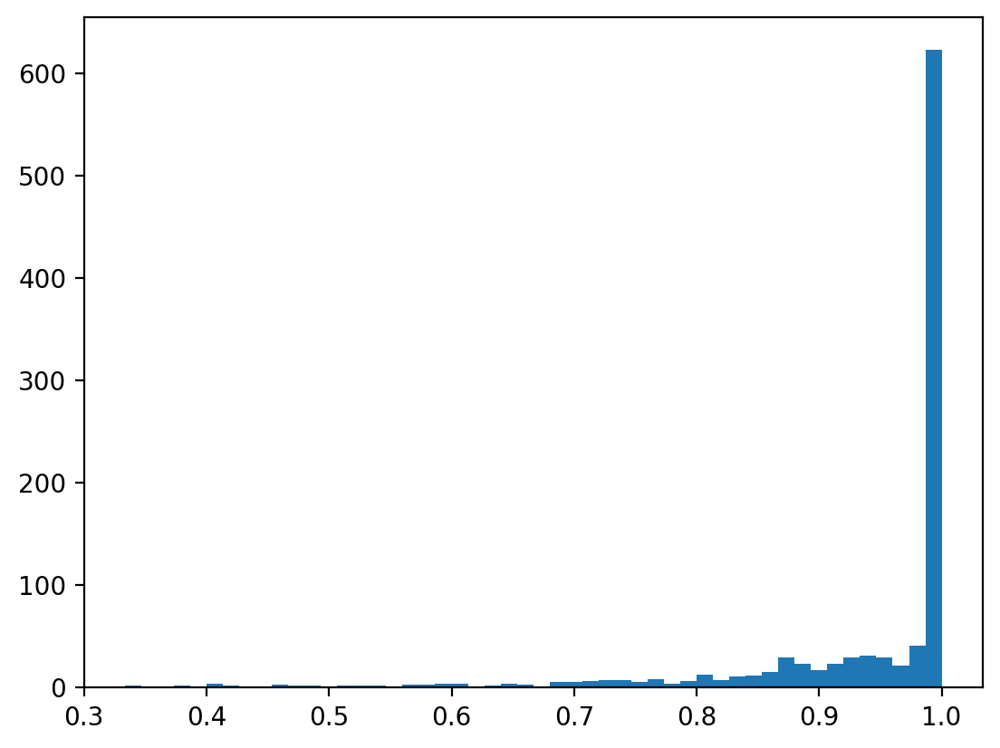

In [10]:
plt.hist(diff, bins=50);
print(f"{diff.mean():.3f}")

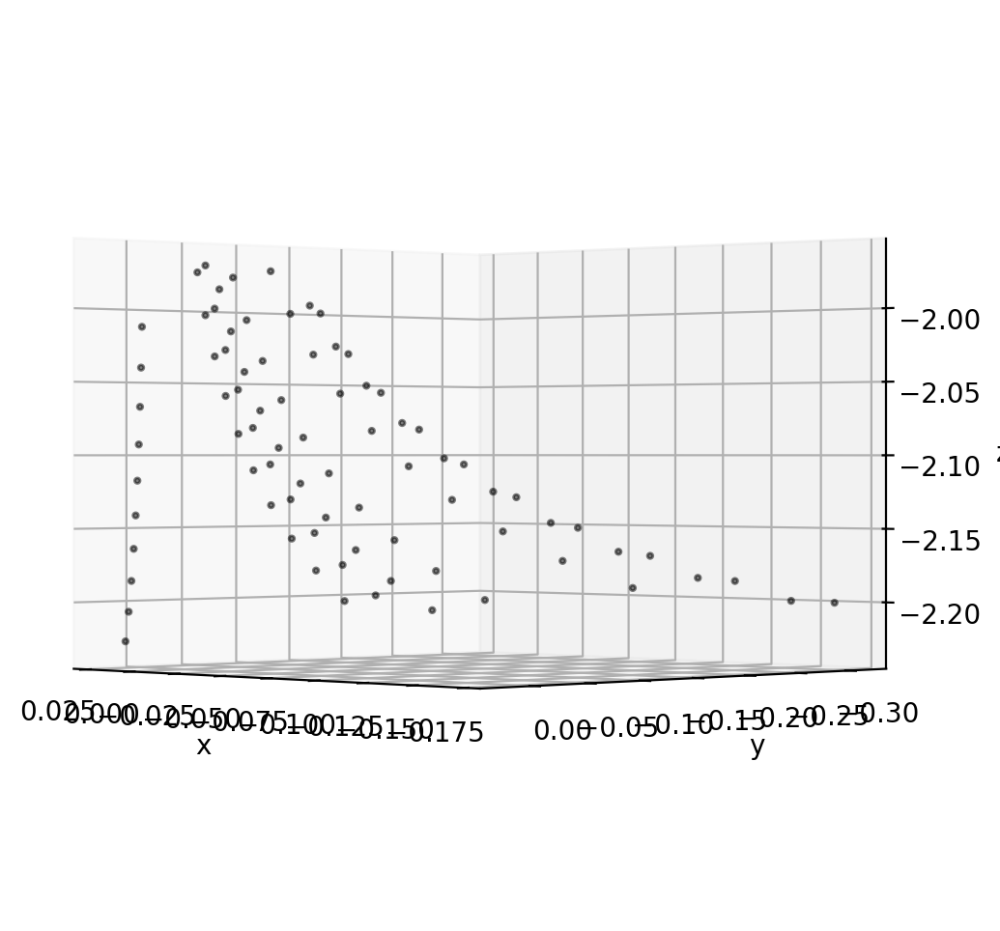

In [11]:
fig=plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")

for t in range(10):
    ax.scatter(*GT[pb_idxs+t].reshape(-1, 3).T, s=4, c ='k', alpha=0.5)

plt.show()

In [13]:
tl = 10  # track length
s = 0


mean_dists = np.zeros(tl)
for t in range(tl):
    points = GT[prox_ball_idxs[s]+t]
    ic_track = GT[ic_idxs[s]+t]
    mean_dists[t] = np.linalg.norm(points - ic_track[None], axis=-1).mean()

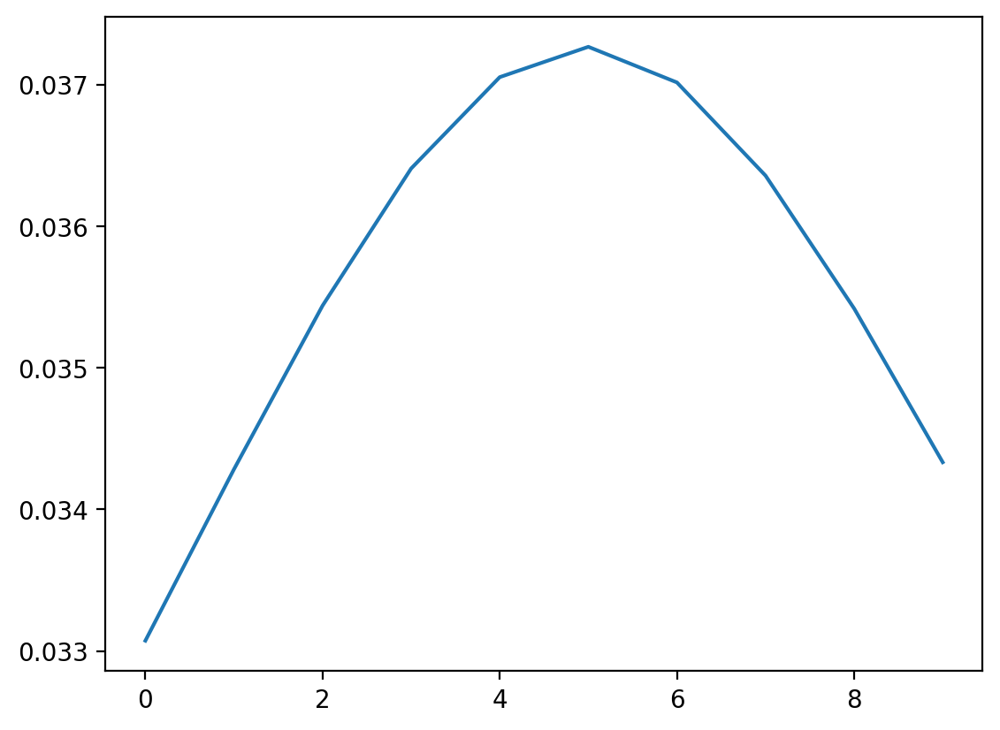

In [14]:
plt.plot(mean_dists)

In [15]:
tl = 100  # track length
mean_dists = np.zeros((S, tl))
for s in tqdm(range(S)):
    pb_idxs = prox_ball_idxs[s]
    pb_idxs = pb_idxs[pb_idxs < S*T - tl]   # filter out indices at the very end of the dataset
    for t in range(tl):
        points = GT[pb_idxs+t]
        ic_track = GT[ic_idxs[s]+t]
        mean_dists[s, t] = np.linalg.norm(points - ic_track[None], axis=-1).mean()

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 511.11it/s]


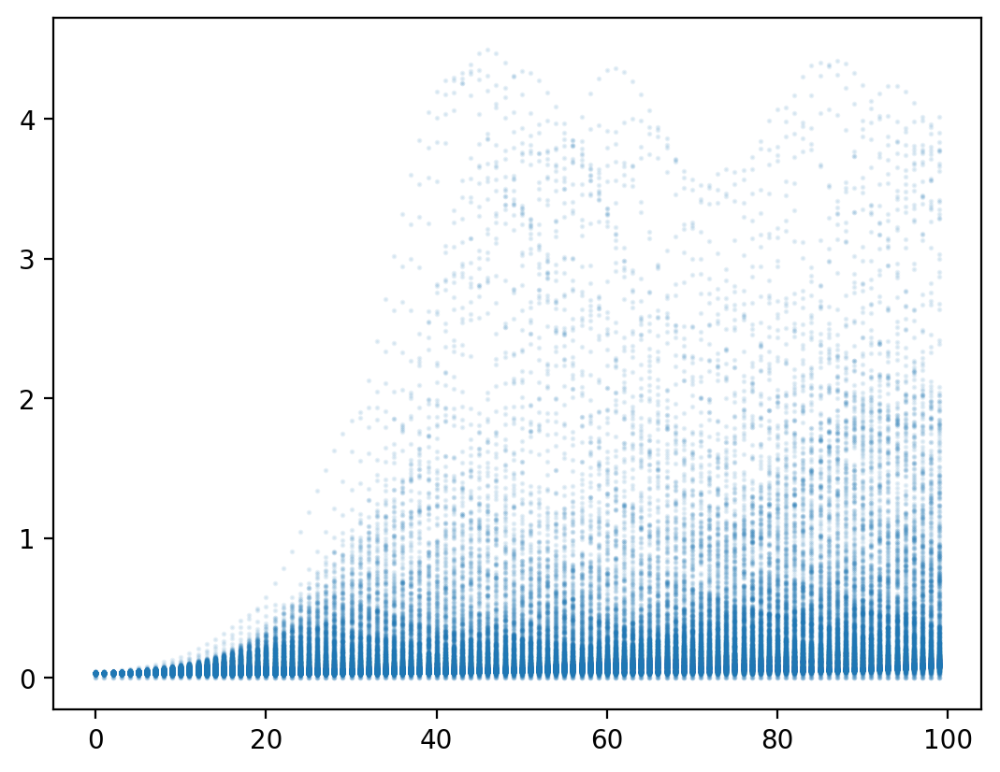

In [16]:
plt.scatter(np.tile(np.arange(tl), (S, 1)), mean_dists, s=1, alpha=0.1)

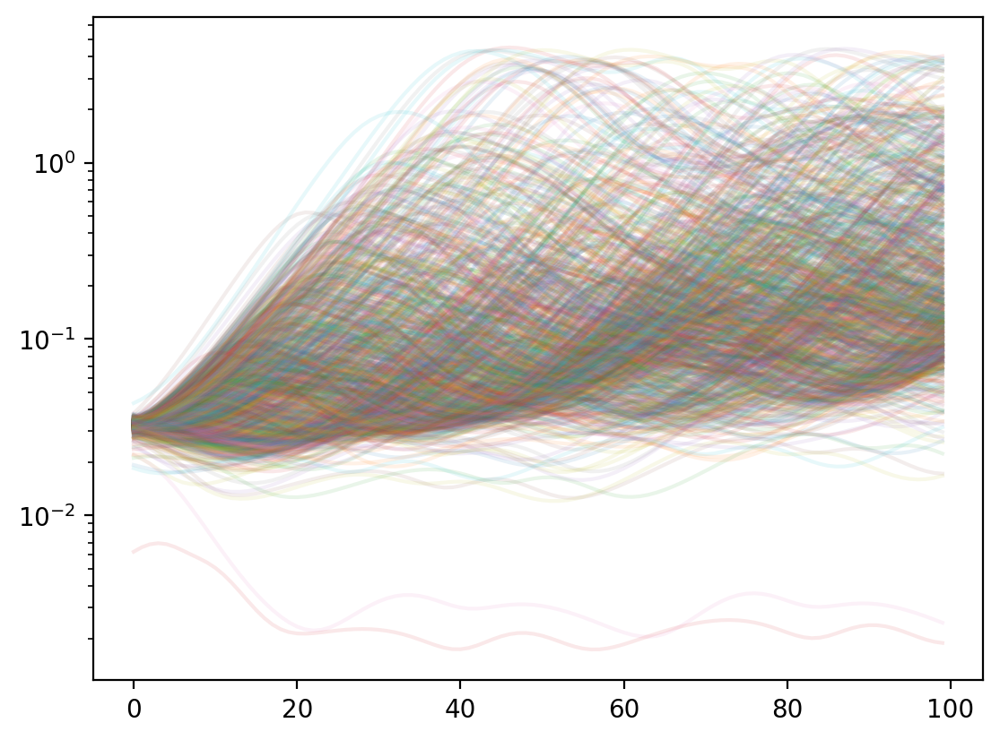

In [17]:
plt.plot(np.tile(np.arange(tl), (S, 1)).T, mean_dists[:, :tl].T, alpha=0.1);#, s=1, alpha=0.1)
plt.yscale('log')

In [18]:
pbi_lengths = [len(idxs) for idxs in prox_ball_idxs]
print(min(pbi_lengths))
print(np.sum(np.array(pbi_lengths) == 1))
print(np.argmin(np.array(pbi_lengths)))

1
3
412


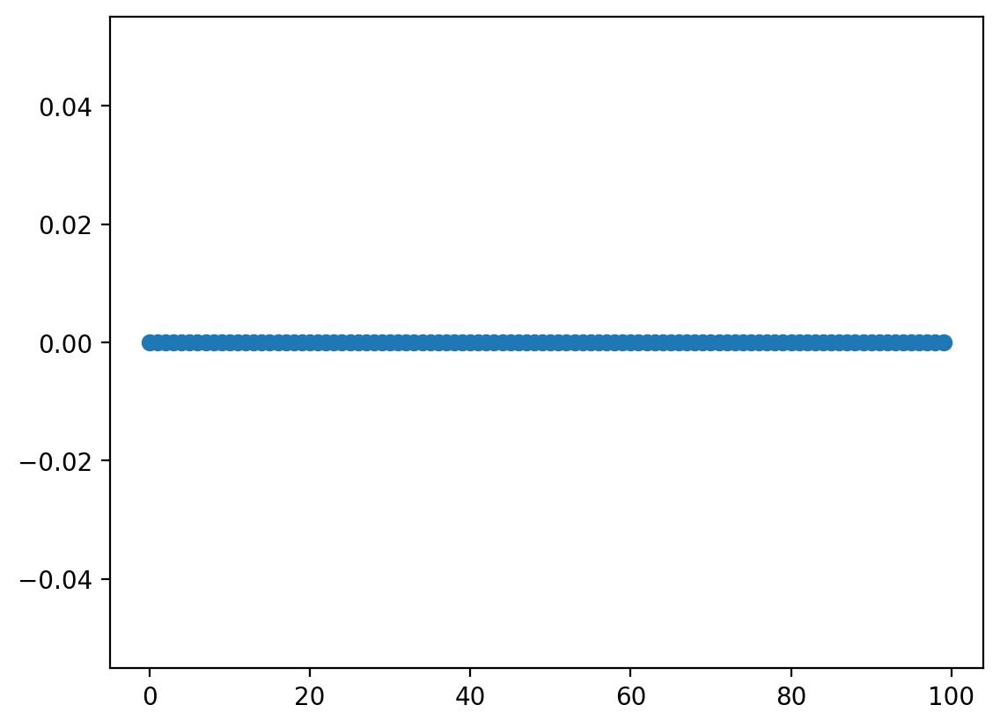

In [19]:
plt.scatter(np.arange(tl), mean_dists[412])

##### Old prototyping

In [22]:
idxs = np.argwhere(mask).flatten()
didxs = idxs[1:] - idxs[:-1]
dmask = didxs > 5
dm_idxs = np.argwhere(dmask).flatten()
dm_idxs = np.concatenate((np.zeros(1, dtype=int), dm_idxs+1), axis=0)
idxs[dm_idxs]

array([ 33421, 107467, 117767, 125918, 131632, 158245, 193889, 199799])

In [20]:
idxs = np.argwhere(mask).flatten()
didxs = idxs[1:] - idxs[:-1]
dmask = didxs > 5
dm_idxs = np.argwhere(dmask).flatten()
dm_idxs = np.concatenate((np.zeros(1), dm_idxs+1), axis=0)
print(dm_idxs)
groups = np.cumsum(dmask)
mean_direction = np.mean(np.array([
    np.linalg.norm(idxs[dm_idxs[i+1]-1] - idxs[dm_idxs[i]])  for i in range(len(dm_idxs)-1)
]))




SyntaxError: closing parenthesis ']' does not match opening parenthesis '(' (755115618.py, line 8)

In [10]:
idxs = np.argwhere(mask).flatten()
idxs = [int(val) for val in idxs]
print(idxs)
i = 0
while i < len(idxs) - 1:
    if idxs[i+1] - 5 < idxs[i]:
        print(idxs.pop(i+1)) 
    else:
        i += 1
        print(i)
print(idxs)

[33421, 33422, 33423, 33424, 107467, 117767, 117768, 117769, 125918, 125919, 125920, 125921, 131632, 131633, 131634, 158245, 193889, 199799, 199800, 199801]
33422
33423
33424
1
2
117768
117769
3
125919
125920
125921
4
131633
131634
5
6
7
199800
199801
[33421, 107467, 117767, 125918, 131632, 158245, 193889, 199799]


In [11]:
GT[idxs]


array([[-2.40736967e-03, -1.53862513e-02, -1.97099819e+00],
       [ 1.47140768e-02,  1.41380667e-02, -2.01266567e+00],
       [-1.99975605e-02, -4.57626967e-02, -1.97494701e+00],
       [-2.16887105e-04, -1.17309445e-02, -1.97567314e+00],
       [-9.82480836e-03, -2.82361974e-02, -1.97923622e+00],
       [-3.04554813e-02, -6.41100016e-02, -1.99832931e+00],
       [-3.32857126e-02, -6.91602216e-02, -2.00368080e+00],
       [-6.12407053e-03, -2.19826351e-02, -1.98718244e+00]])

#### Coloring GT tracks with DPU to see "dynamic regimes"

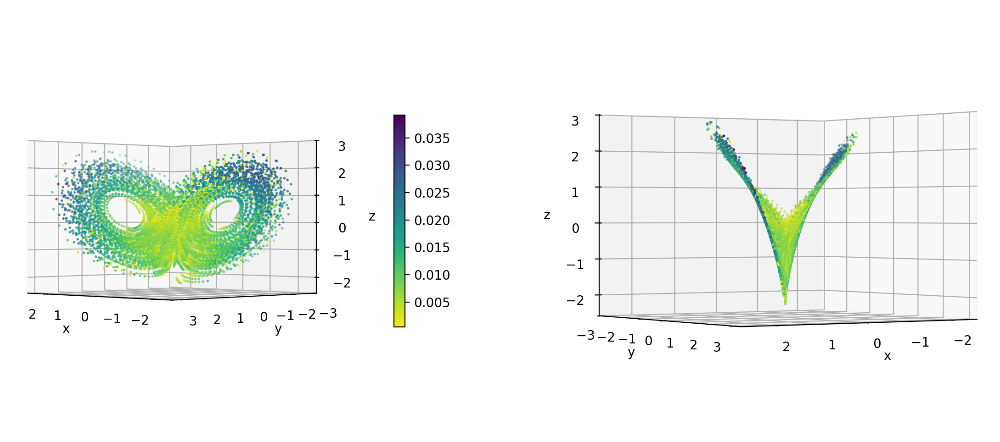

In [50]:
fig=plt.figure(figsize=(14, 6))
track_length = 10

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
scatter = ax.scatter(*gt_tracks[:, :track_length].reshape(-1, 3).T, s=1,
                     c=DPU_radius[:, :track_length].reshape(-1), cmap='viridis_r')
plt.colorbar(scatter, shrink=0.5, pad=0.15)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
scatter = ax.scatter(*gt_tracks[:, :track_length].reshape(-1, 3).T, s=1,
                     c=DPU_radius[:, :track_length].reshape(-1), cmap='viridis_r')
                     
plt.show()

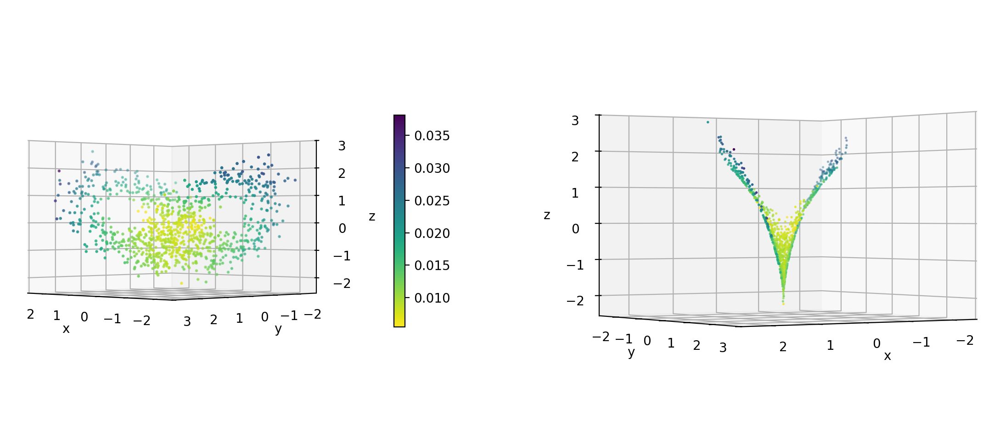

In [55]:
fig=plt.figure(figsize=(14, 6))
track_pos = 8

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
scatter = ax.scatter(*gt_tracks[:, track_pos].reshape(-1, 3).T, s=2,
                     c=DPU_radius[:, track_pos].reshape(-1), cmap='viridis_r')
plt.colorbar(scatter, shrink=0.5, pad=0.15)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
scatter = ax.scatter(*gt_tracks[:, track_pos].reshape(-1, 3).T, s=1,
                     c=DPU_radius[:, track_pos].reshape(-1), cmap='viridis_r')
                     
plt.show()

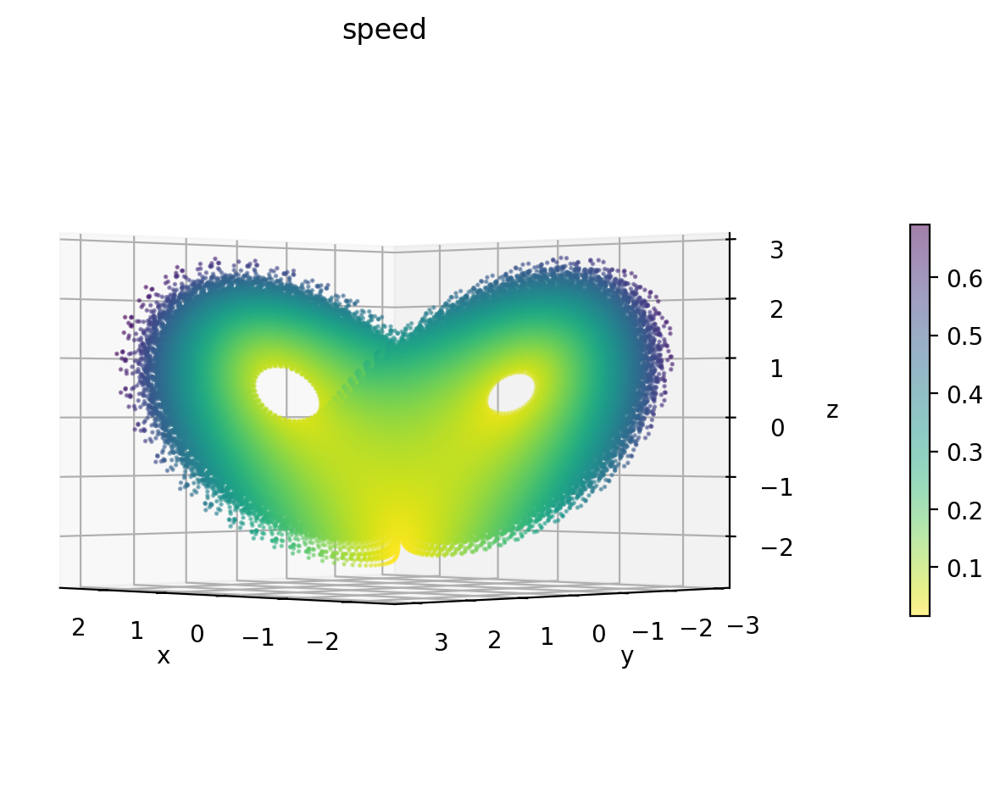

In [56]:
fig=plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_title("speed")
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")

speed = np.linalg.norm(gt_tracks[:, 1:] - gt_tracks[:, :-1], axis=-1)
scatter = ax.scatter(*gt_tracks[:, 1:].reshape(-1, 3).T, s=1, c=speed.reshape(-1), cmap='viridis_r', alpha=0.5)
plt.colorbar(scatter, shrink=0.5, pad=0.15)

plt.show()

In [59]:
print(f"{pearsonr(DPU_radius[:, track_pos], speed[:, track_pos]).statistic:.2f}")

0.87


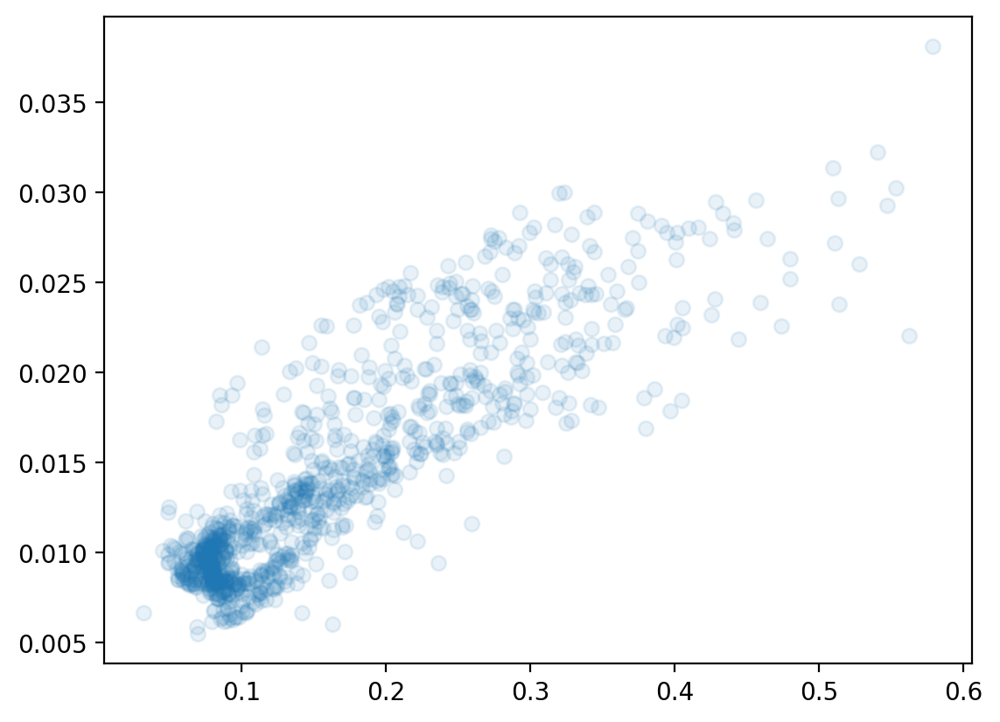

In [64]:
plt.scatter(speed[:, track_pos], DPU_radius[:, track_pos], alpha=0.1);

In [80]:
track_pos = 8
print(f"C(DPU_r, dist_to_gt) @ t={track_pos}:\t\t {pearsonr(DPU_radius[:, track_pos], mean_dist_to_gt[:, track_pos]).statistic: .2f}")
print(f"C(DPU_r, speed) @ t={track_pos}:\t\t\t {pearsonr(DPU_radius[:, track_pos], speed[:, track_pos]).statistic: .2f}")
print(f"C(DPU_r/speed, dist_to_gt) @ t={track_pos}:\t {pearsonr(DPU_radius[:, track_pos] / speed[:, track_pos], mean_dist_to_gt[:, track_pos]).statistic: .2f}")
print()
track_pos = 50
print(f"C(DPU_r, dist_to_gt) @ t={track_pos}:\t\t {pearsonr(DPU_radius[:, track_pos], mean_dist_to_gt[:, track_pos]).statistic: .2f}")
print(f"C(DPU_r, speed) @ t={track_pos}:\t\t\t {pearsonr(DPU_radius[:, track_pos], speed[:, track_pos]).statistic: .2f}")
print(f"C(DPU_r/speed, dist_to_gt) @ t={track_pos}:\t {pearsonr(DPU_radius[:, track_pos] / speed[:, track_pos], mean_dist_to_gt[:, track_pos]).statistic: .2f}")

C(DPU_r, dist_to_gt) @ t=8:		  0.71
C(DPU_r, speed) @ t=8:			  0.87
C(DPU_r/speed, dist_to_gt) @ t=8:	 -0.17

C(DPU_r, dist_to_gt) @ t=50:		  0.83
C(DPU_r, speed) @ t=50:			  0.64
C(DPU_r/speed, dist_to_gt) @ t=50:	  0.46


In [82]:
corr = np.array([pearsonr(DPU_radius[:, t] / speed[:, t], mean_dist_to_gt[:, t]).statistic  for t in range(Tp)])
print(f"{corr.max():.2f} @ {corr.argmax()}")

0.59 @ 60


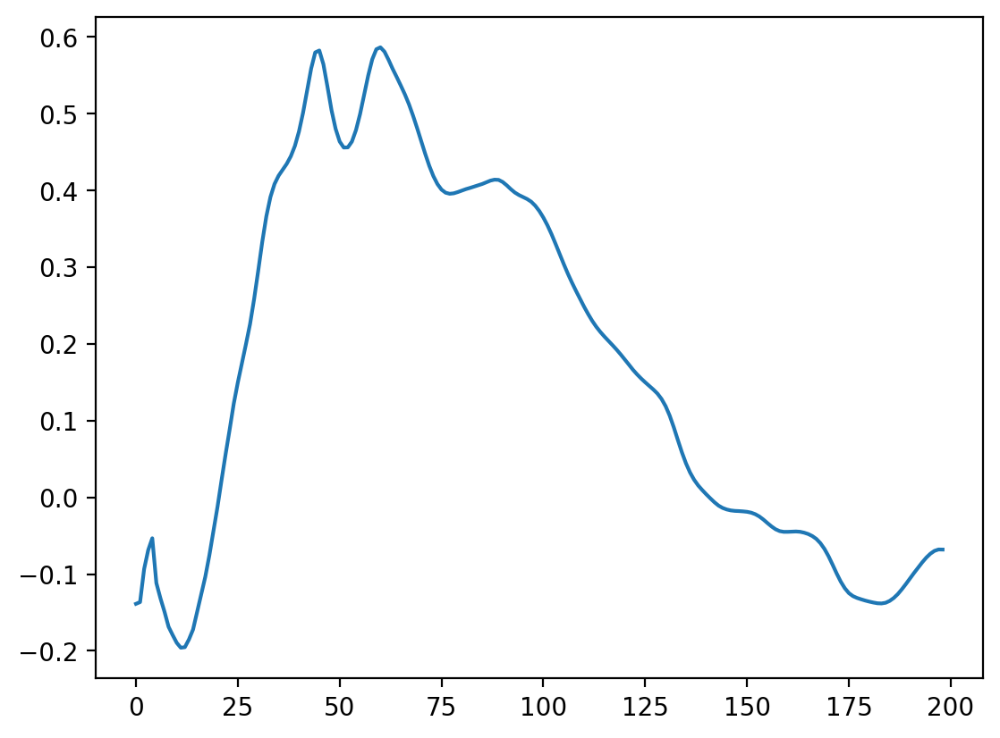

In [83]:
plt.plot(corr)

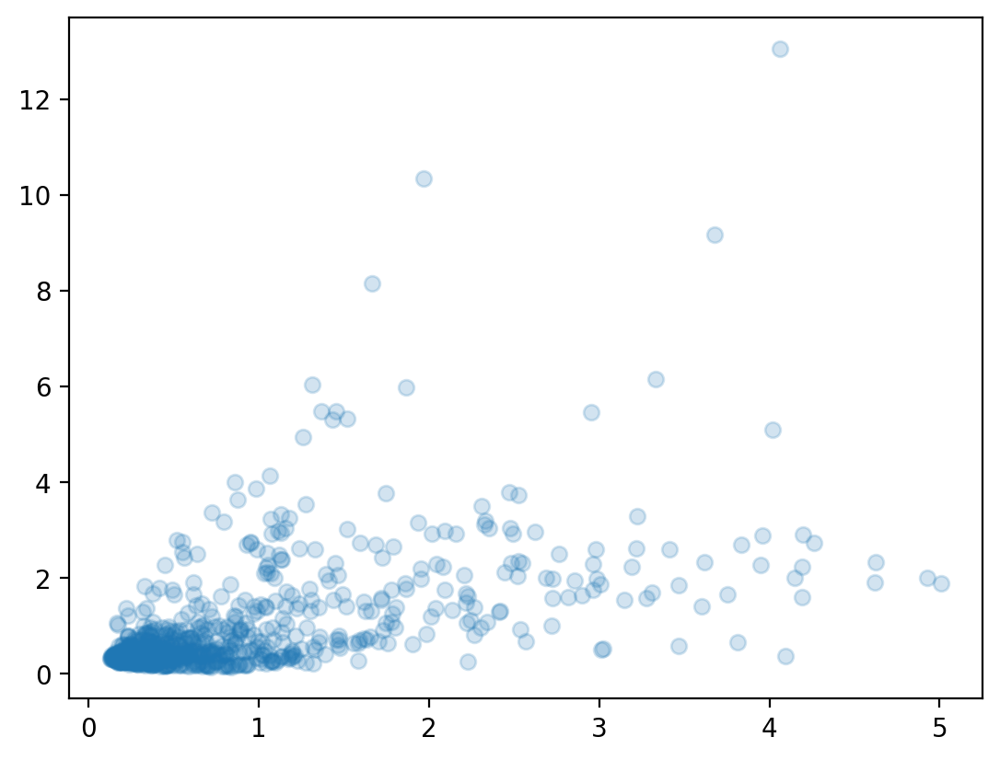

In [88]:
t = 60
plt.scatter(mean_dist_to_gt[:, t], DPU_radius[:, t] / speed[:, t], alpha=0.2);

#### Correlating change in prediction uncertainty with change in distance to GT

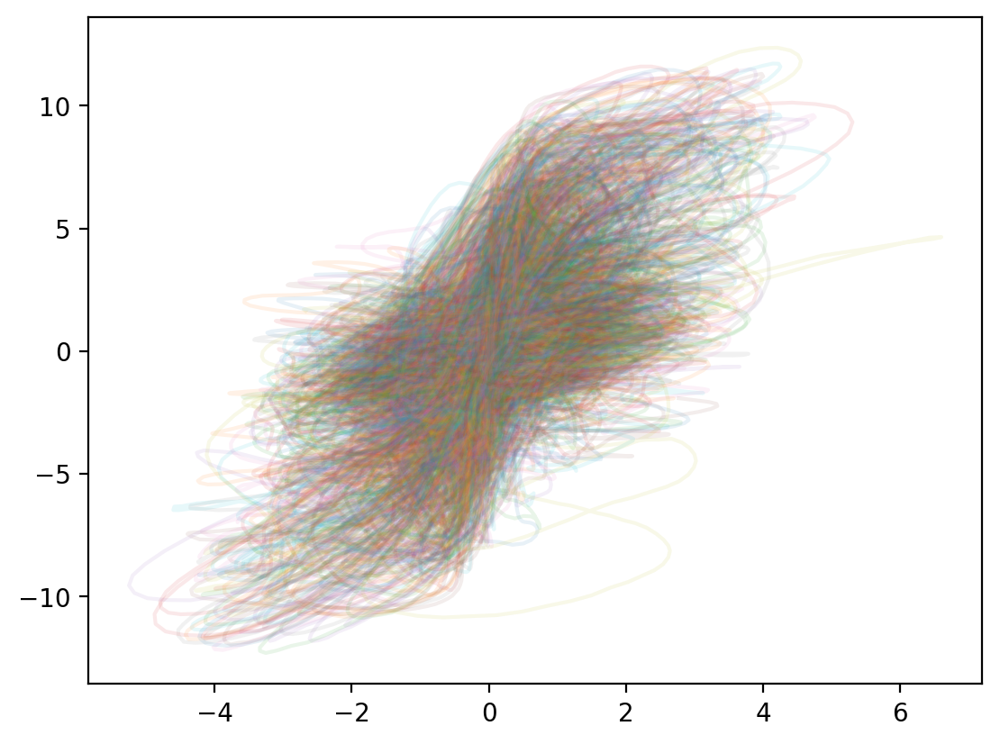

In [51]:
plt.plot(d_dist_to_gt.T, d_pred_unc.T, alpha=0.1);

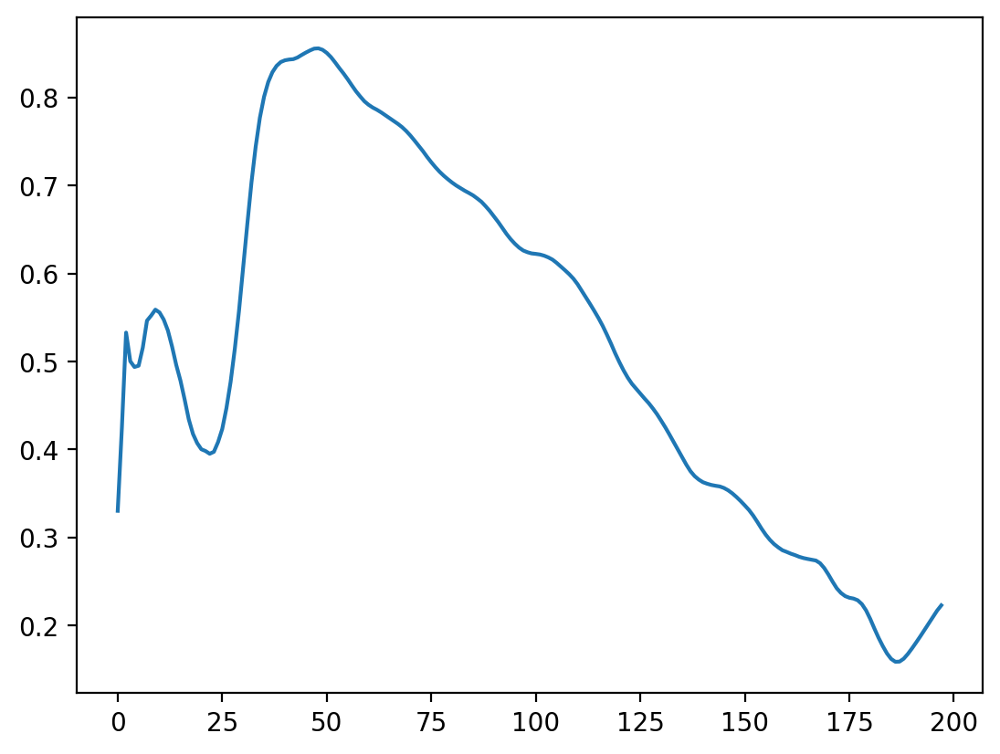

In [52]:
corr = np.zeros(Tp-1)
for t in range(Tp-1):
    corr[t] = pearsonr(d_dist_to_gt[:, t], d_pred_unc[:, t]).statistic

plt.plot(corr);

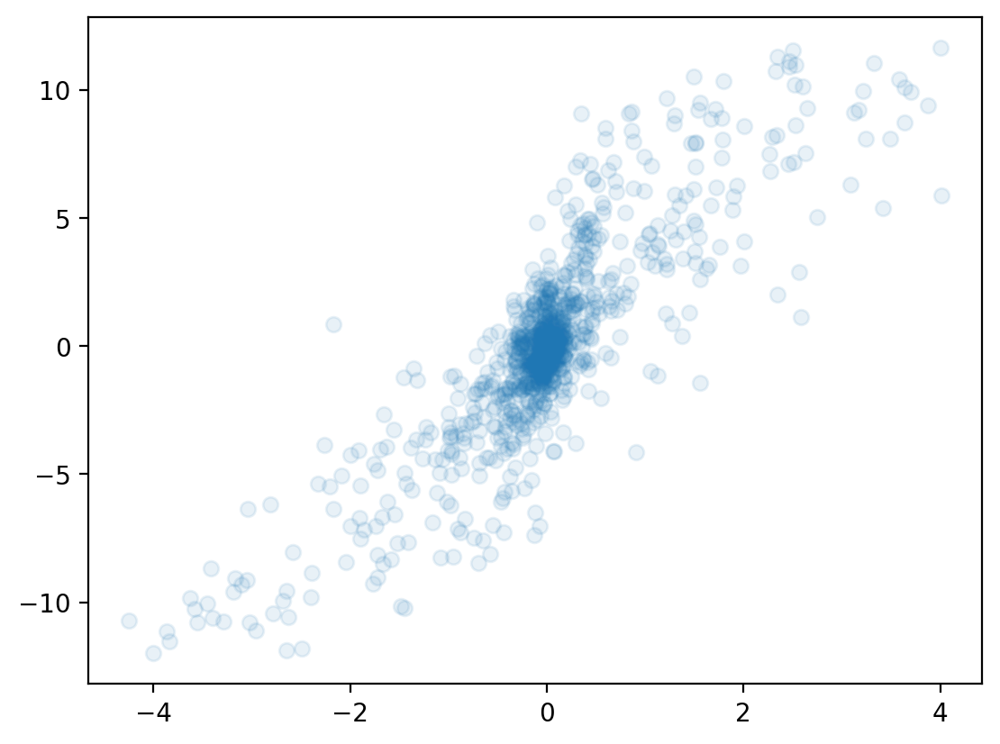

In [62]:
plt.scatter(d_dist_to_gt.T[50], d_pred_unc.T[50], alpha=0.1);

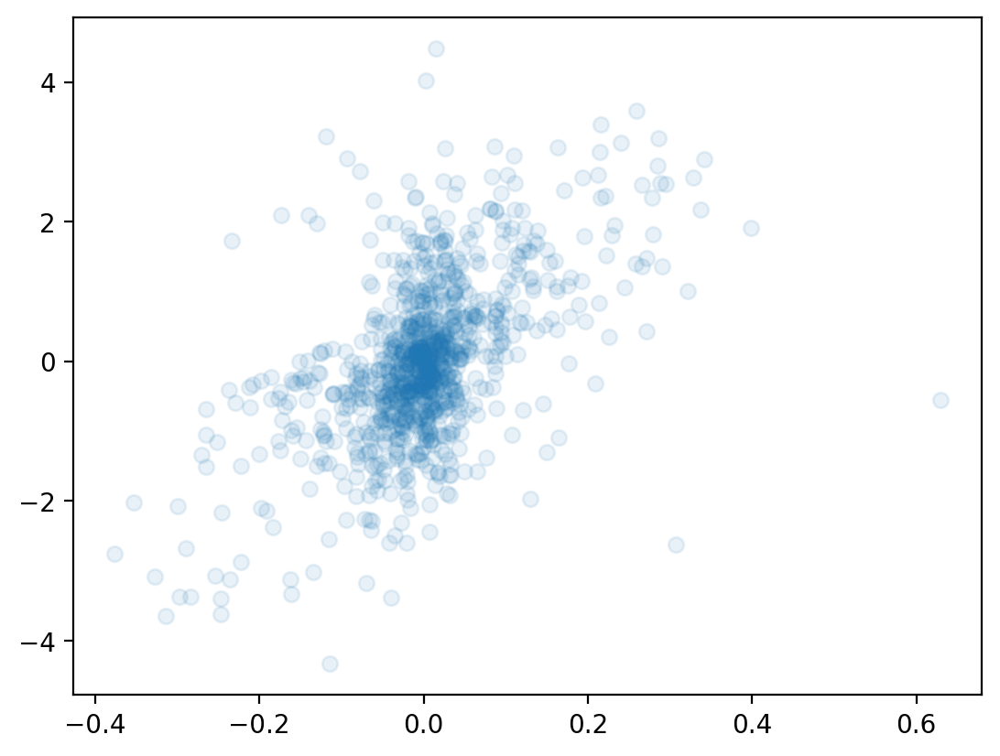

In [63]:
plt.scatter(d_dist_to_gt.T[12], d_pred_unc.T[12], alpha=0.1);

#### Correlating prediction uncertainty with distance to GT

In [26]:
print(pred_unc.min(), pred_unc.max(), pred_unc.mean())

-23.24719010872478 0.7465524546677984 -5.988082358162529


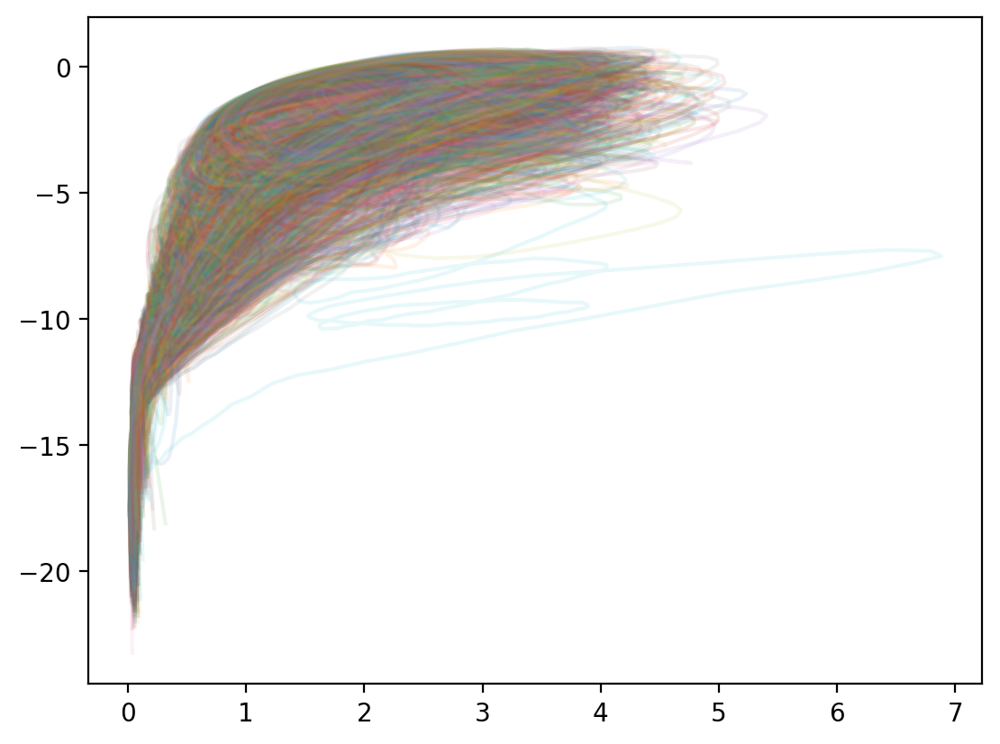

In [38]:
plt.plot(mean_dist_to_gt.T, pred_unc.T, alpha=0.1);

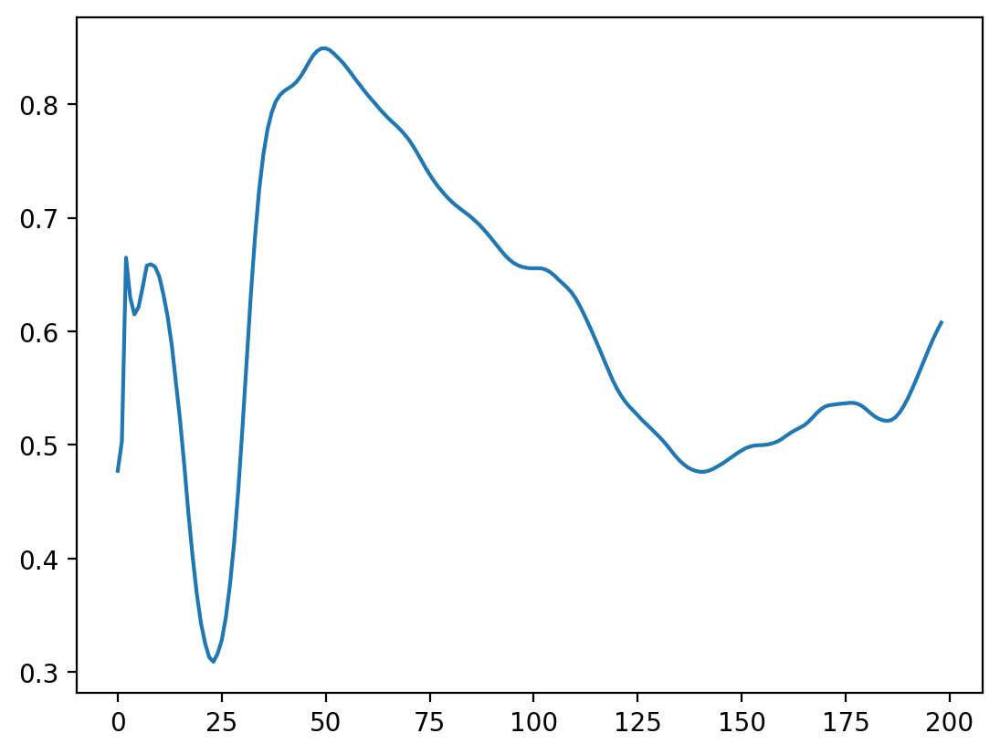

In [47]:
corr = np.zeros(Tp)
for t in range(Tp):
    corr[t] = pearsonr(mean_dist_to_gt[:, t], pred_unc[:, t]).statistic

plt.plot(corr);

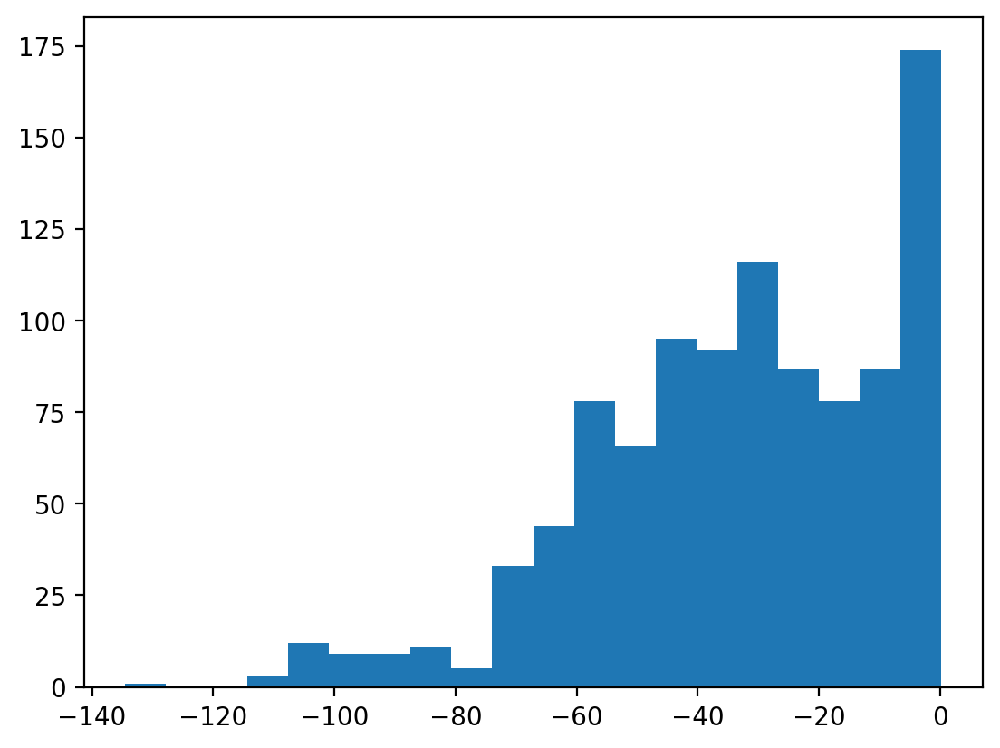

In [14]:
dpu_gtd_ratio = pred_unc.T[50]/mean_dist_to_gt.T[50]
plt.hist(dpu_gtd_ratio, bins=20);

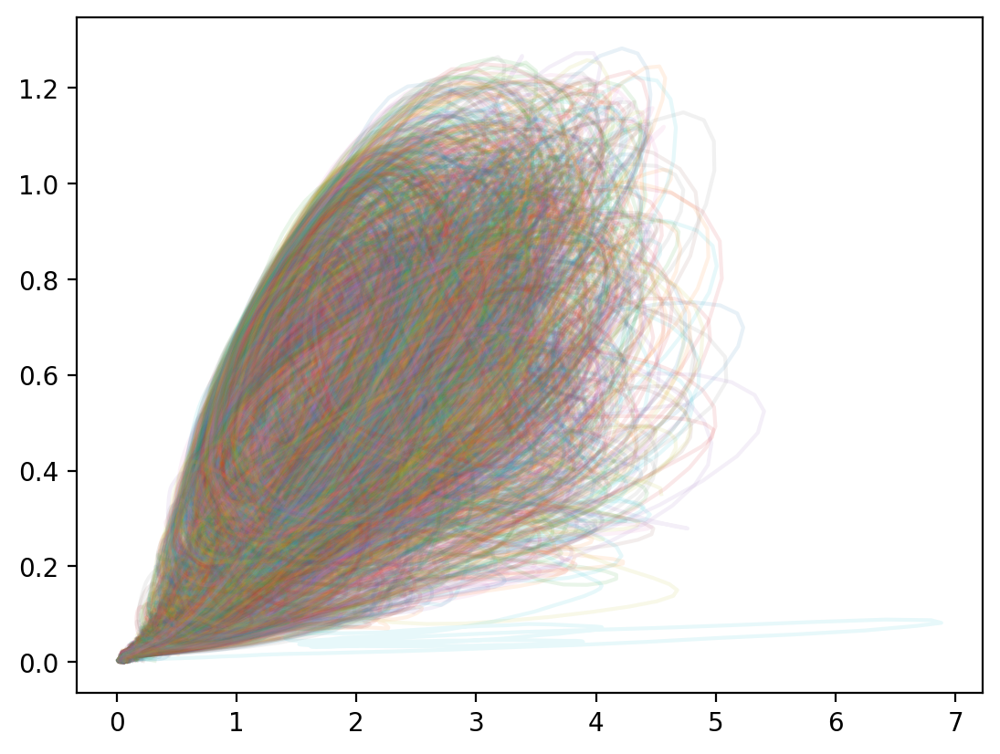

In [39]:
plt.plot(mean_dist_to_gt.T, (np.exp(pred_unc)**(1/3)).T, alpha=0.1);

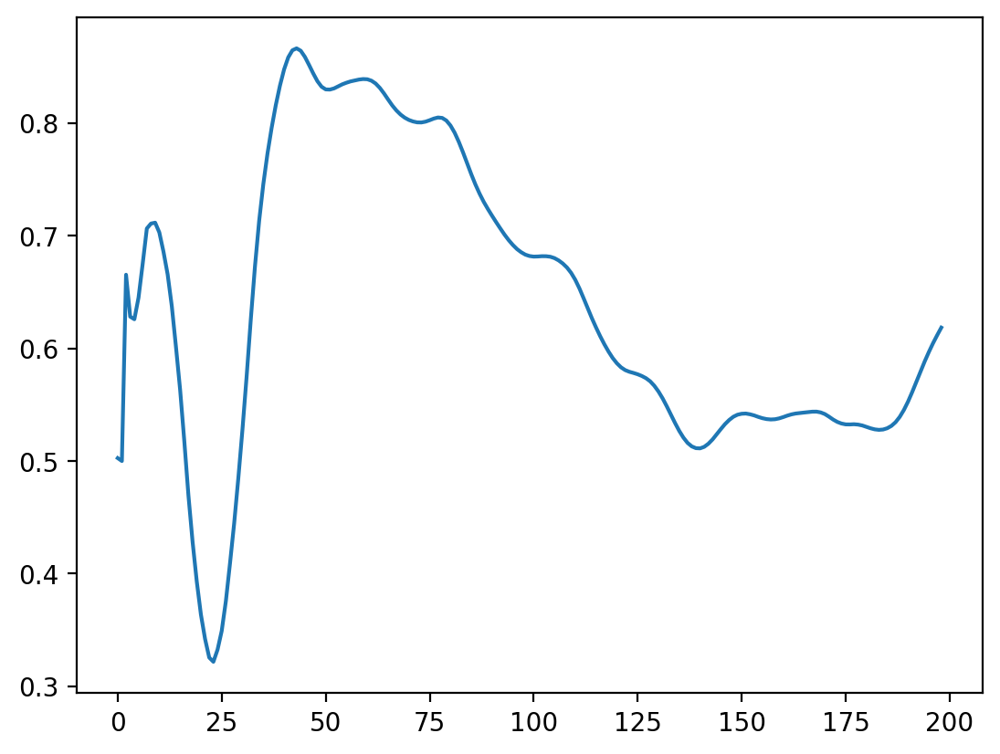

In [34]:
corr = np.zeros(Tp)
for t in range(Tp):
    corr[t] = pearsonr(mean_dist_to_gt[:, t], (np.exp(pred_unc)**(1/3))[:, t]).statistic

plt.plot(corr);

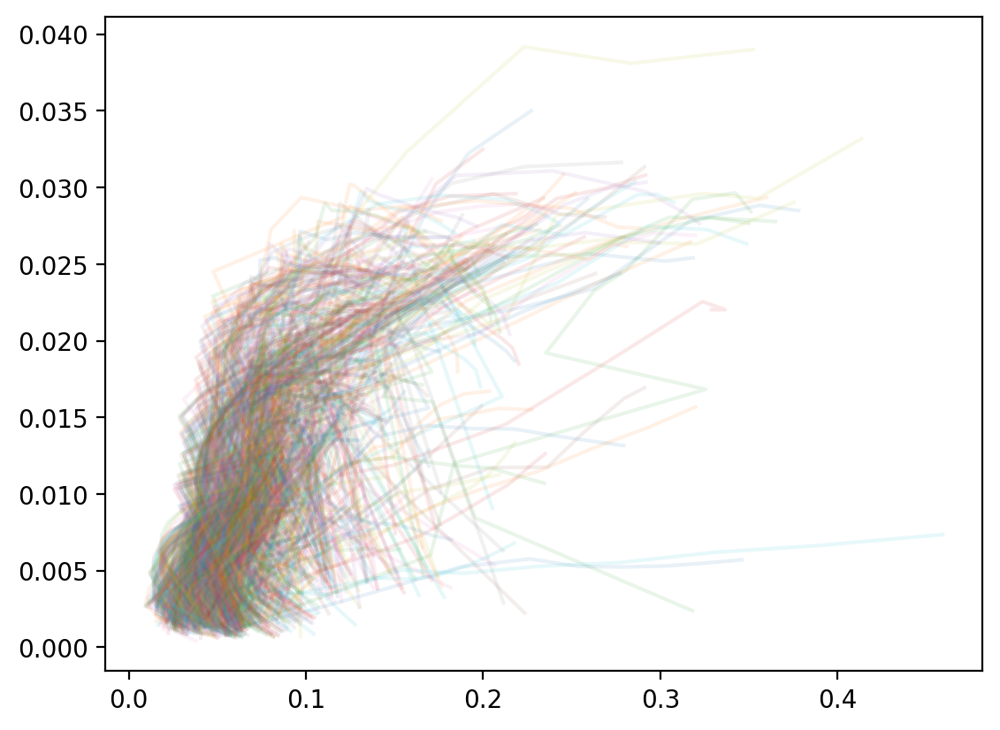

In [60]:
plt.plot(mean_dist_to_gt.T[:10], (np.exp(pred_unc)**(1/3)).T[:10], alpha=0.1);

c = 0.83


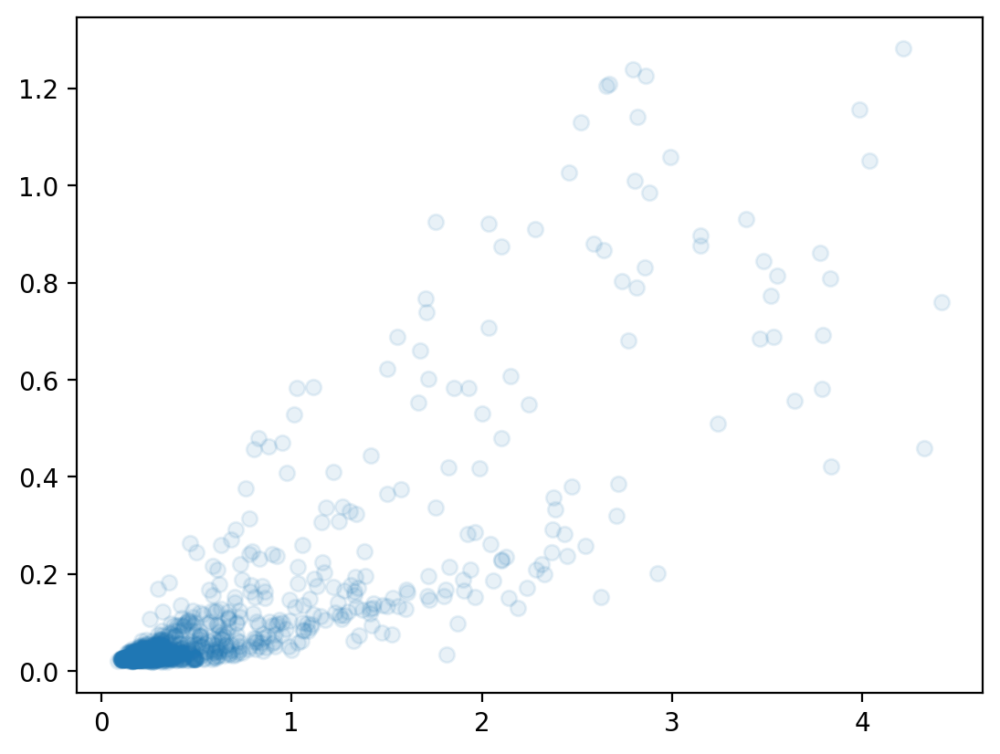

In [36]:
plt.scatter(mean_dist_to_gt.T[50], (np.exp(pred_unc)**(1/3)).T[50], alpha=0.1);
print(f"c = {corr[50]:.2f}")

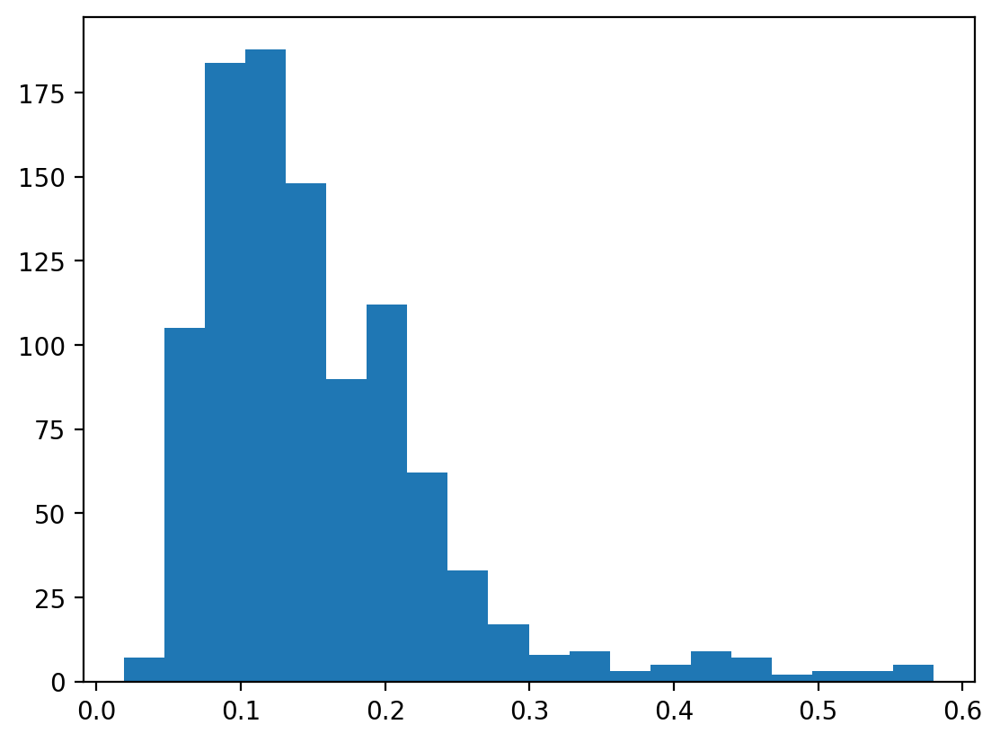

In [25]:
dpu_gtd_ratio = (np.exp(pred_unc)**(1/3)).T/mean_dist_to_gt.T
plt.hist(dpu_gtd_ratio[50], bins=20);

0.14 */ 1.65


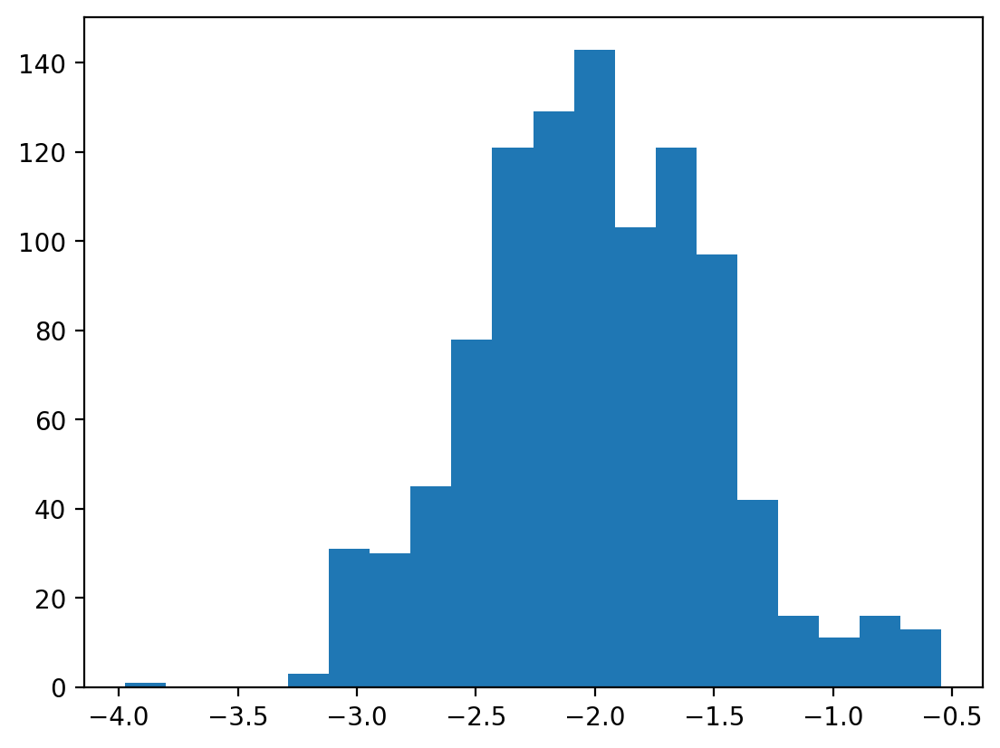

In [13]:
plt.hist(np.log(dpu_gtd_ratio[50]), bins=20);
print(f"{np.exp(np.log(dpu_gtd_ratio[50]).mean()):.2f} */ {np.exp(np.log(dpu_gtd_ratio[50]).std()):.2f}")

In [38]:
min_unc = np.min(np.exp(np.log(dpu_gtd_ratio).std(axis=1)))
argmin_unc = np.argmin(np.exp(np.log(dpu_gtd_ratio).std(axis=1)))
mean_atmin = np.exp(np.log(dpu_gtd_ratio).mean(axis=1))[argmin_unc]
print(f"min. uncertainty: {mean_atmin:.2f} */ {min_unc:.2f} @ {argmin_unc}")

min_unc = np.min(dpu_gtd_ratio[1:].std(axis=1))
argmin_unc = np.argmin(dpu_gtd_ratio[1:].std(axis=1))
mean_atmin = dpu_gtd_ratio.mean(axis=1)[argmin_unc]
print(f"min. uncertainty: {mean_atmin:.3f} ± {min_unc:.3f} @ {argmin_unc}")

min. uncertainty: 0.16 */ 1.38 @ 8
min. uncertainty: 0.164 ± 0.047 @ 8


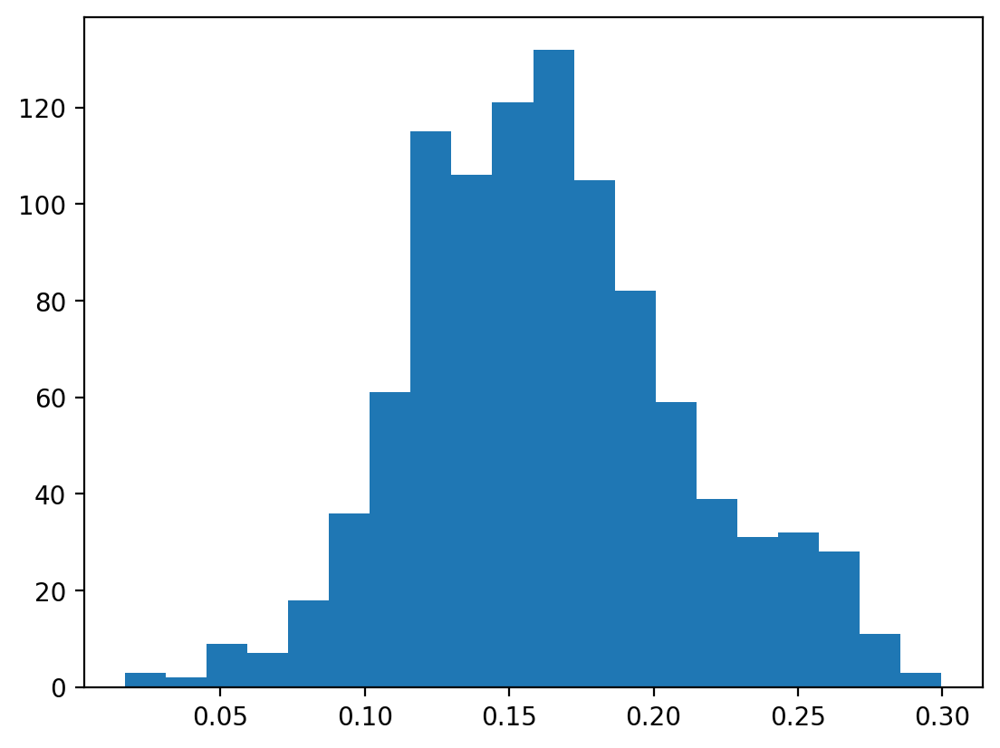

In [30]:
plt.hist(dpu_gtd_ratio[argmin_unc], bins=20);

c = 0.71


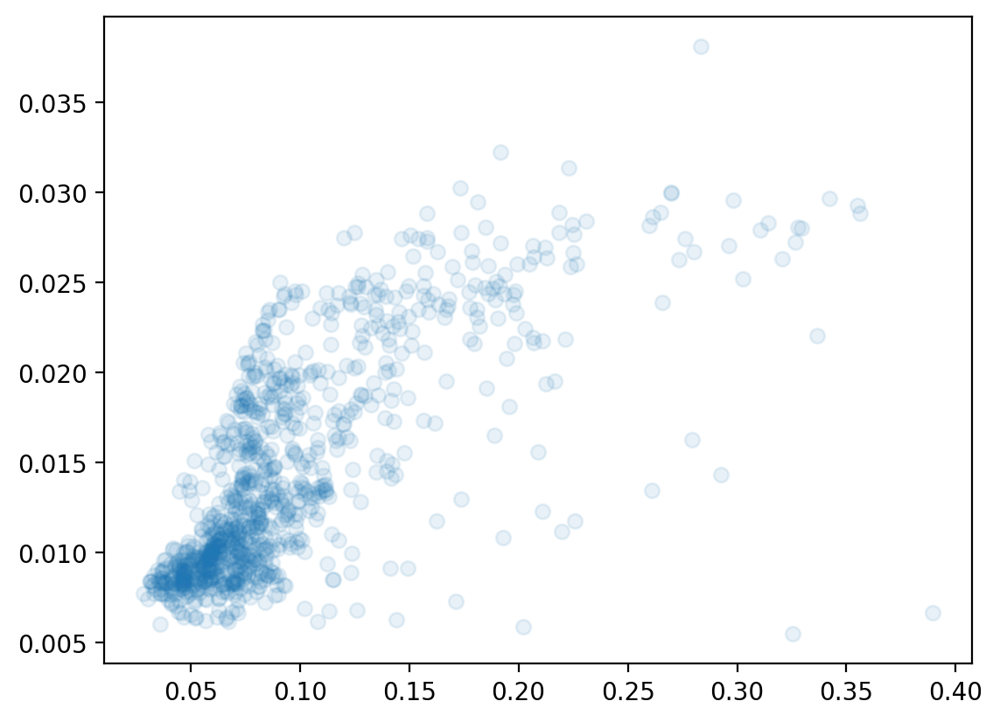

In [37]:
plt.scatter(mean_dist_to_gt.T[8], (np.exp(pred_unc)**(1/3)).T[8], alpha=0.1);
print(f"c = {corr[8]:.2f}")

In [59]:
# Figuring out how correlation behaves wrt. nonlinear relationships
x = np.arange(0.1, 100, 0.1)
print(pearsonr(np.exp(x), x).statistic)
print(pearsonr(x**2, x).statistic)
print(pearsonr(2*x, x).statistic)
print(pearsonr(np.sqrt(x), x).statistic)
print(pearsonr(np.log(x), x).statistic)

0.24270507345860123
0.9683064483806272
0.9999999999999999
0.9800143922289748
0.87330962315296


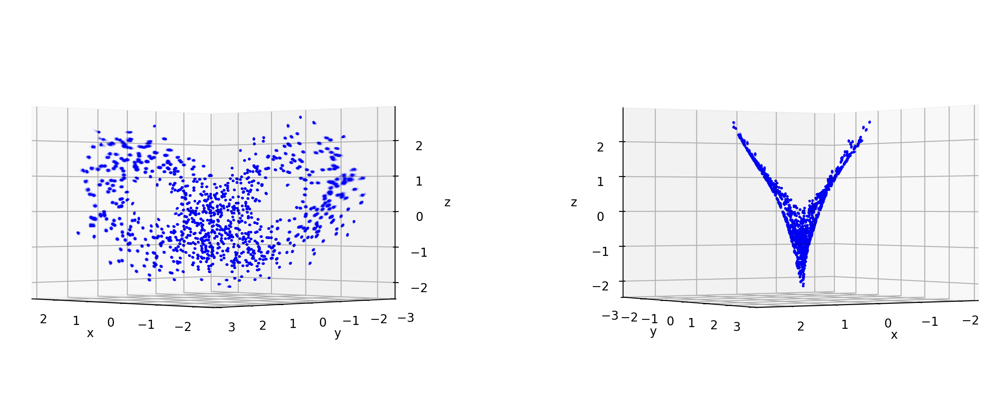

In [19]:
# Checking that t=0 of X_Date already contains uncertainty balls.

fig=plt.figure(figsize=(16, 6))
#fig.suptitle("Example of the big foracasting data set")

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
for i in range(3):   # for some reason, plt doesn't show 300k points all at once but 3x 100k points are ok.
    ax.scatter(*X_Data[:, 0].reshape(-1, 3)[(i)*100000:(i+1)*100000].T, s=1, c='blue', alpha=0.01)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
for i in range(3):   # for some reason, plt doesn't show 300k points all at once but 3x 100k points are ok.
    ax.scatter(*X_Data[:, 0].reshape(-1, 3)[(i)*100000:(i+1)*100000].T, s=1, c='blue', alpha=0.01)

#plt.legend()
plt.show()

#### Correlating initial distance to GT with later distances

In [59]:
start_dist = distances_to_gt[:, 0]

In [68]:
corr = np.zeros((199,300))
for t in range(199):
    corr[t] = pearsonr(start_dist, distances_to_gt[:, t]).statistic

In [69]:
corr.shape

(199, 300)

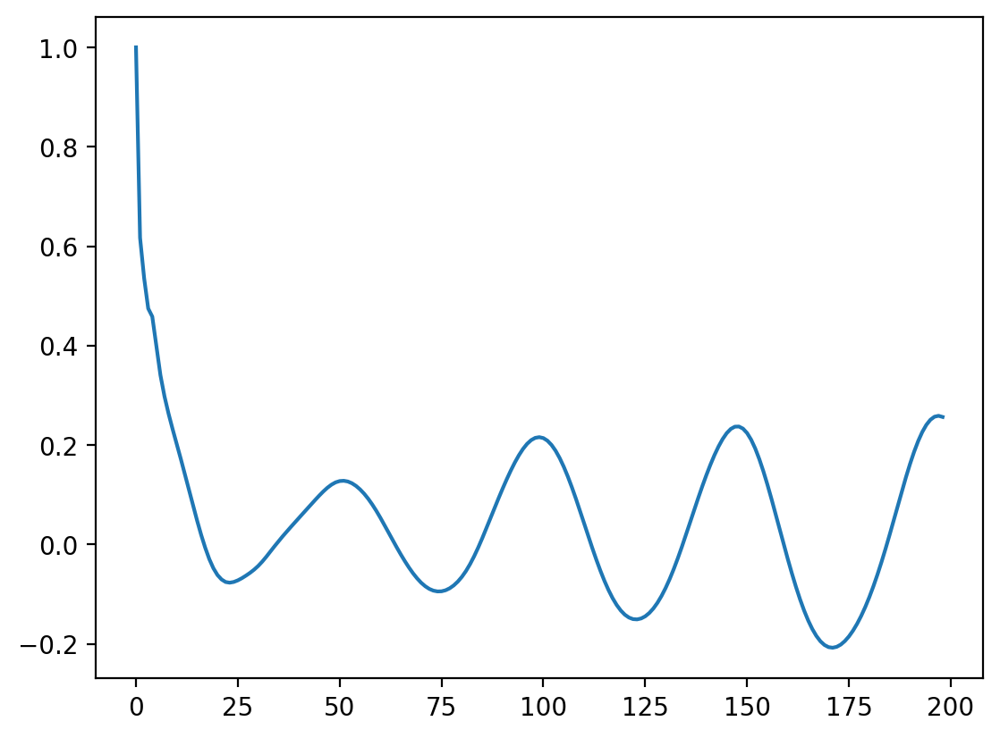

In [70]:
plt.plot(corr.mean(axis=1))

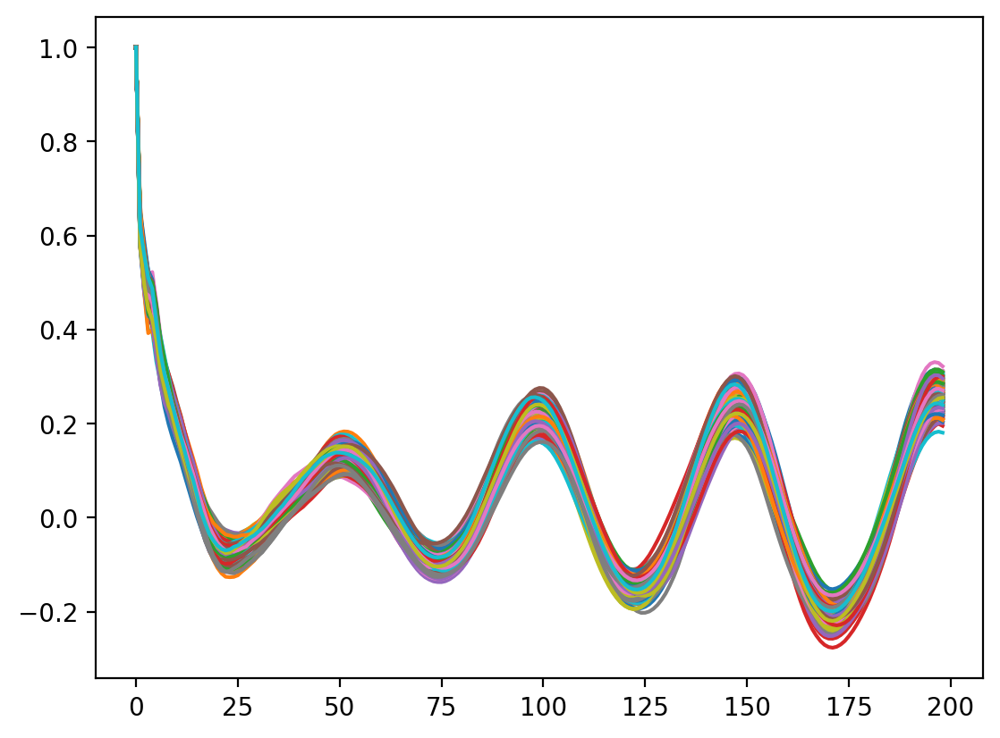

In [74]:
plt.plot(corr);

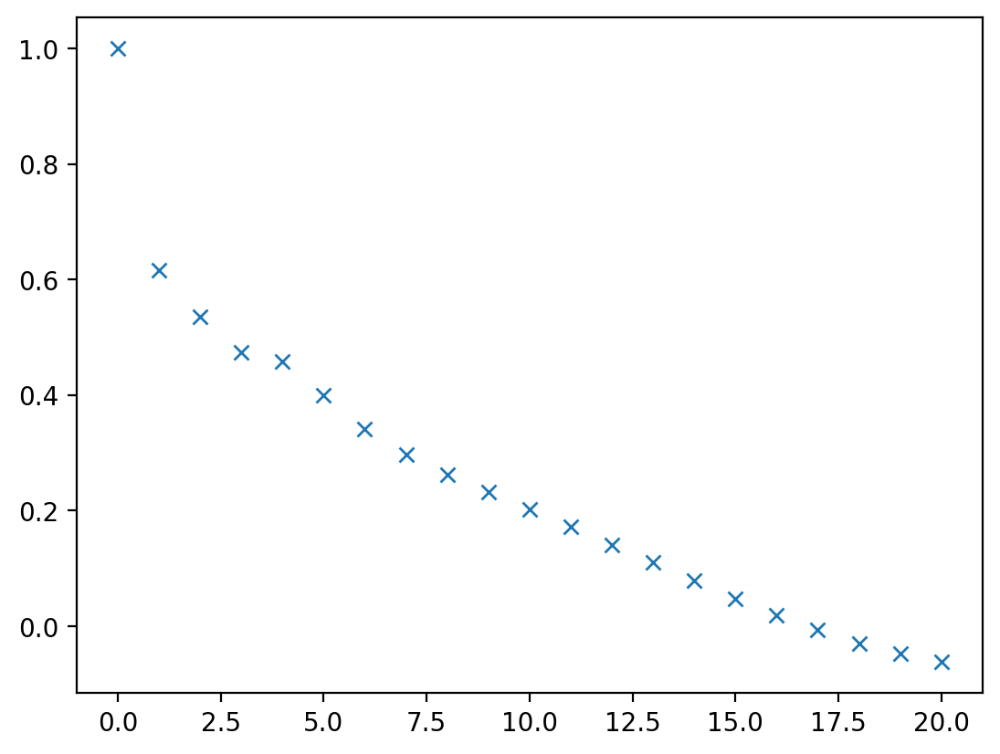

In [80]:
plt.plot(corr.mean(axis=1)[:21], 'x');

In [79]:
corr2 = np.zeros((199))
for t in range(199):
    corr2[t] = pearsonr(start_dist.ravel(), distances_to_gt[:, t].ravel()).statistic

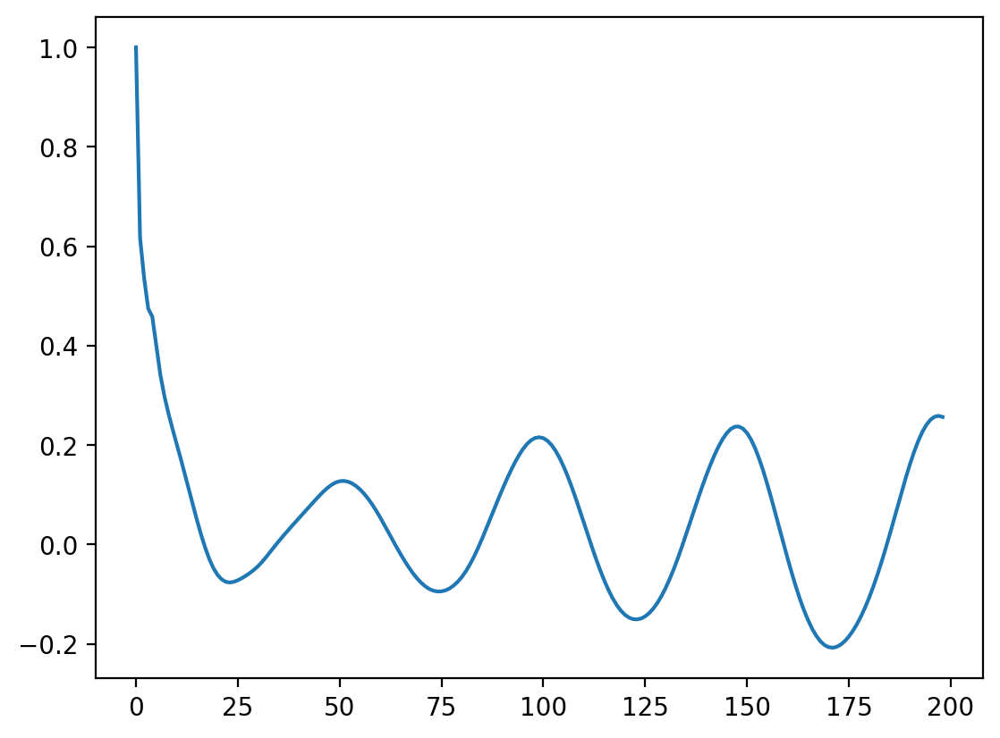

In [81]:
plt.plot(corr2);

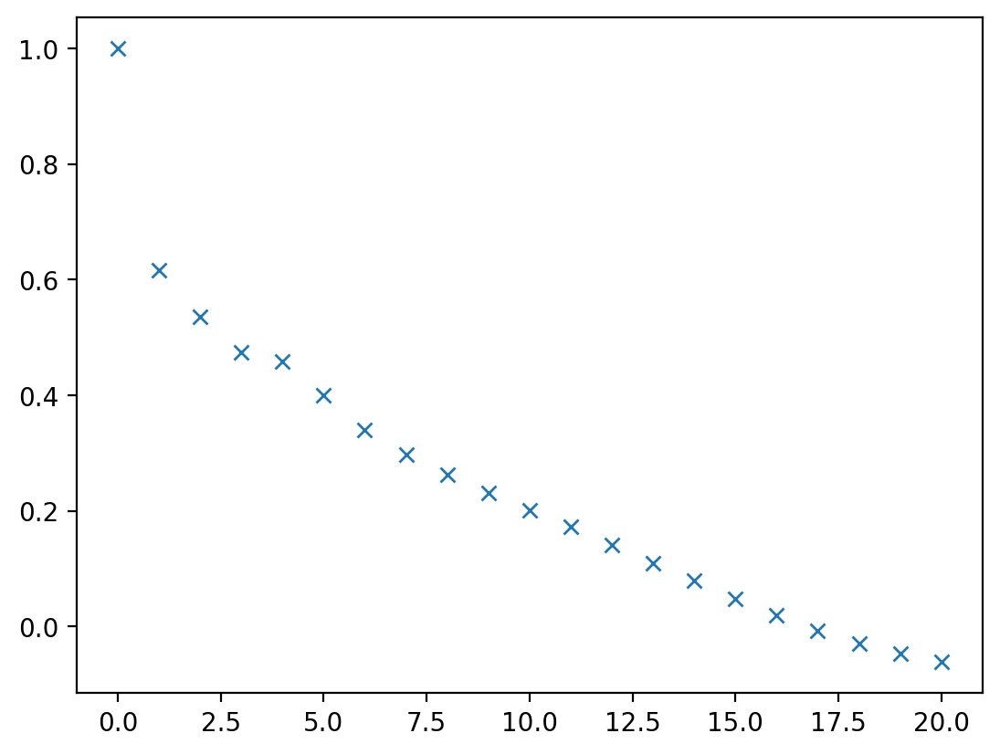

In [82]:
plt.plot(corr2[:21], 'x');

#### First look at the forecasting dataset - seeing how the prediction diverges

In [9]:
initial_conditions, gt_tracks, context, Z_Data, Att_Noise = np.load(f"predictions/lorenz63_big_forecasting_dataset.npz").values()
print(initial_conditions.shape)
print(gt_tracks.shape)
print(context.shape)
print(Z_Data.shape)
print(Att_Noise.shape)

(1000, 3)
(1000, 200, 3)
(10000, 3)
(1000, 200, 300, 30)
(1000, 200, 300, 3)


In [15]:
X_Data = Z_Data[...,:3] * context.std() + context.mean()   # unstandardize Z-data to GT standard.

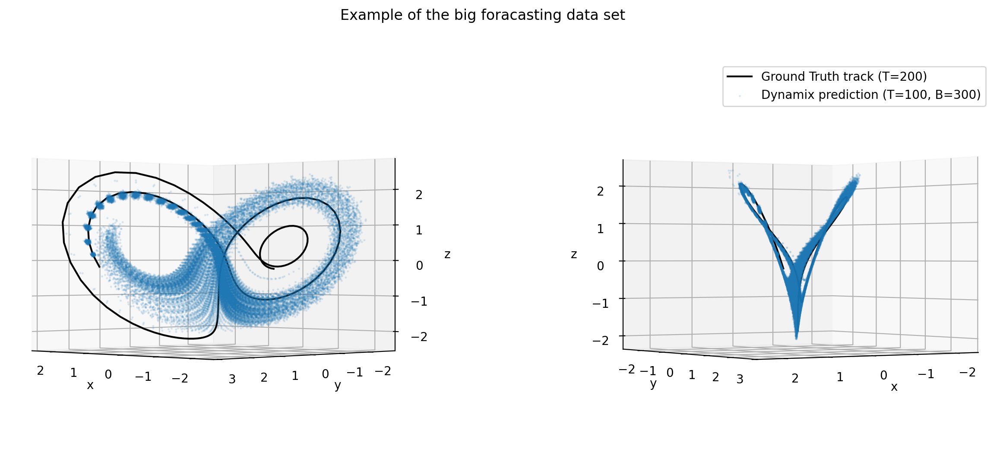

In [70]:
fig=plt.figure(figsize=(16, 6))
fig.suptitle("Example of the big foracasting data set")

T_plt = 100
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[0].T, 'k', label='ground truth track (T=200)')
#ax.scatter(*gt_tracks[0, :T_plt].T, c='k', s=1, label='ground truth track (T=200)')
ax.scatter(*X_Data[0, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[0, :T_plt].T, 'k', label='Ground Truth track (T=200)')
ax.scatter(*X_Data[0, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1, label='Dynamix prediction (T=100, B=300)')

plt.legend()
plt.show()

In [54]:
gts = gt_tracks[0, 1:101, None].repeat(300, axis=1)   # (100, 300, 3)
xs  = X_Data[0, :100]   # (100, 300, 3)
mean_dist_to_gt = np.linalg.norm(xs - gts, axis=-1).mean(axis=-1)
print(mean_dist_to_gt.shape)

(100,)


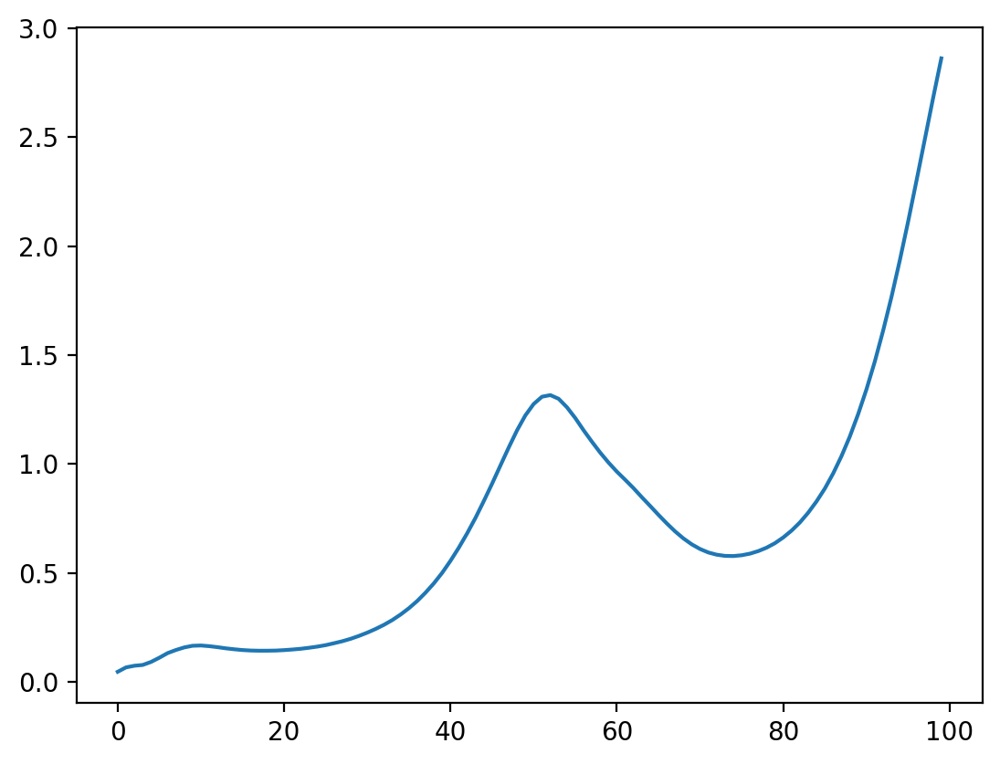

In [55]:
plt.plot(np.arange(100), mean_dist_to_gt)

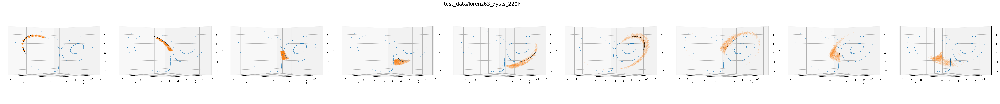

In [67]:
A1, A2 = 9, 1
fig, axs = plt.subplots(A2, A1, figsize=(A1*8, A2*8), 
                        subplot_kw={'projection':'3d'},
                        gridspec_kw={'wspace': 0.1, 'hspace': -0.3},)
fig.suptitle(f"{gt_file_name}", fontsize=20, y=0.85)

T_plt = 10 * (np.arange(9, dtype=int) + 1)
for a2 in range(A2):
    for a1 in range(A1):
        ax = axs[a1] #axs[a2, a1]
        ax.view_init(elev=0, azim=135, roll=0)
        ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
        ax.scatter(*gt_tracks[0].T, s=1)
        ax.plot(*gt_tracks[0, T_plt[a1]-10:T_plt[a1]].T, 'k')
        ax.scatter(*X_Data[0, T_plt[a1]-10:T_plt[a1]].reshape(-1, 3).T, s=1, alpha=0.1)

plt.show()

##### Looking at distance of pred. to gt over time

In [ ]:
# Computing the distance of each prediction thread to GT
gt_batch = gt_tracks[:,1:, None].repeat(B, axis=2)   # (1000, 199, 300, 3) == X_Data.shape
distances_to_gt = np.linalg.norm(X_Data[:,:-1] - gt_batch, axis=-1)   # (1000, 199, 300)
mean_dist_to_gt = distances_to_gt.mean(axis=-1)   # (1000, 199)

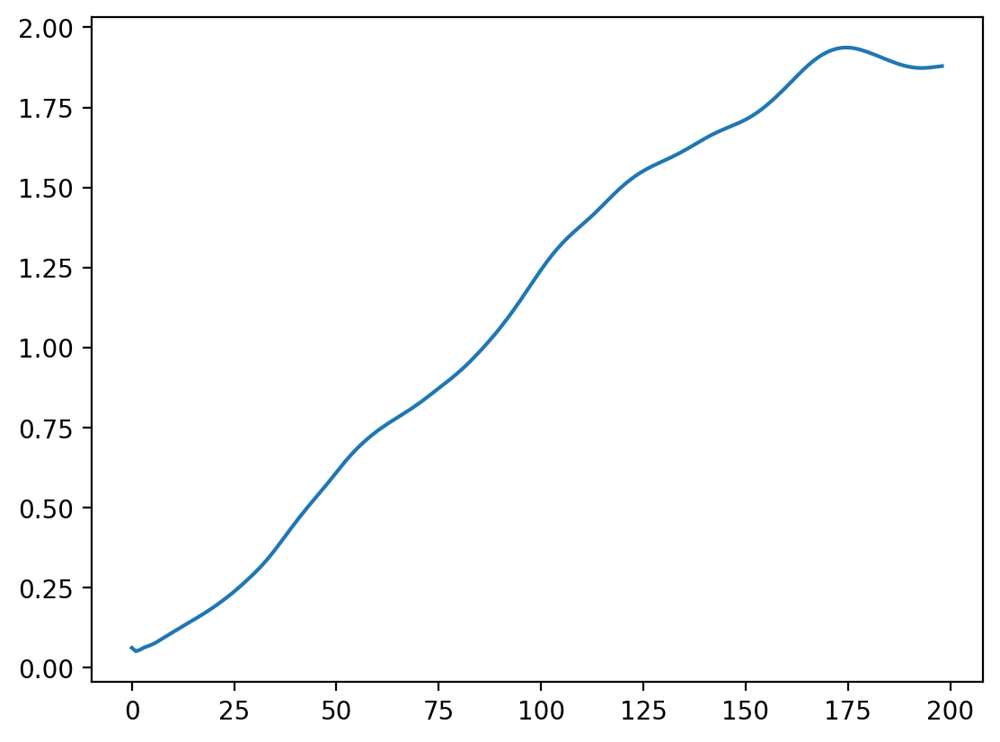

In [17]:
plt.plot(mean_dist_to_gt.mean(axis=0));

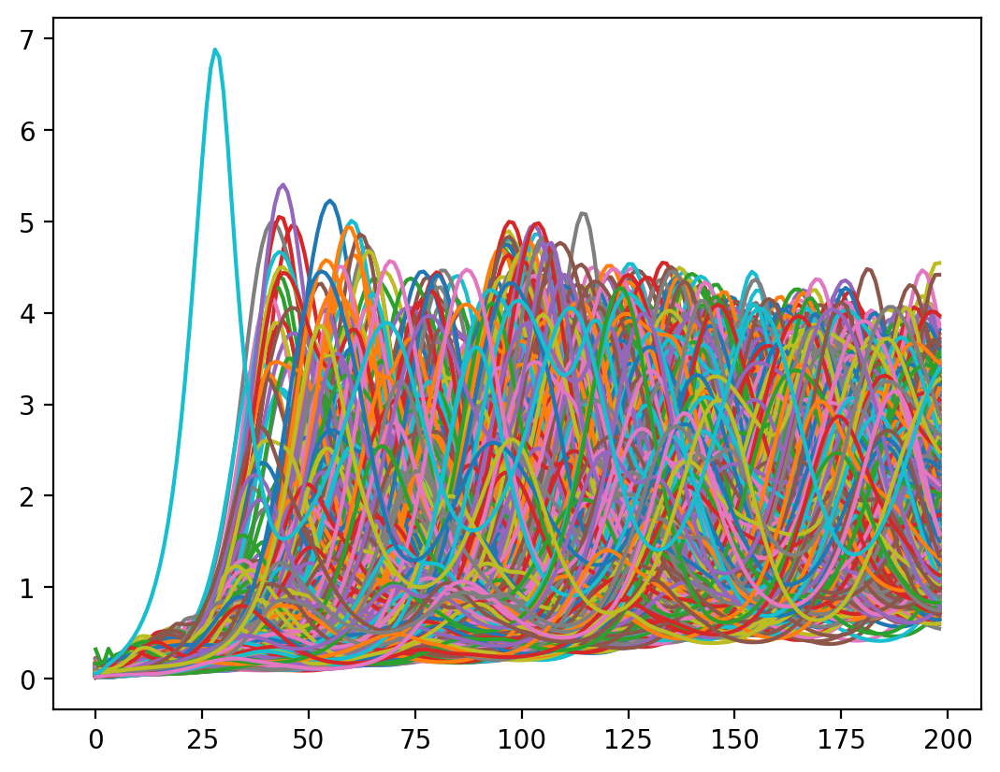

In [21]:
plt.plot(mean_dist_to_gt.T);

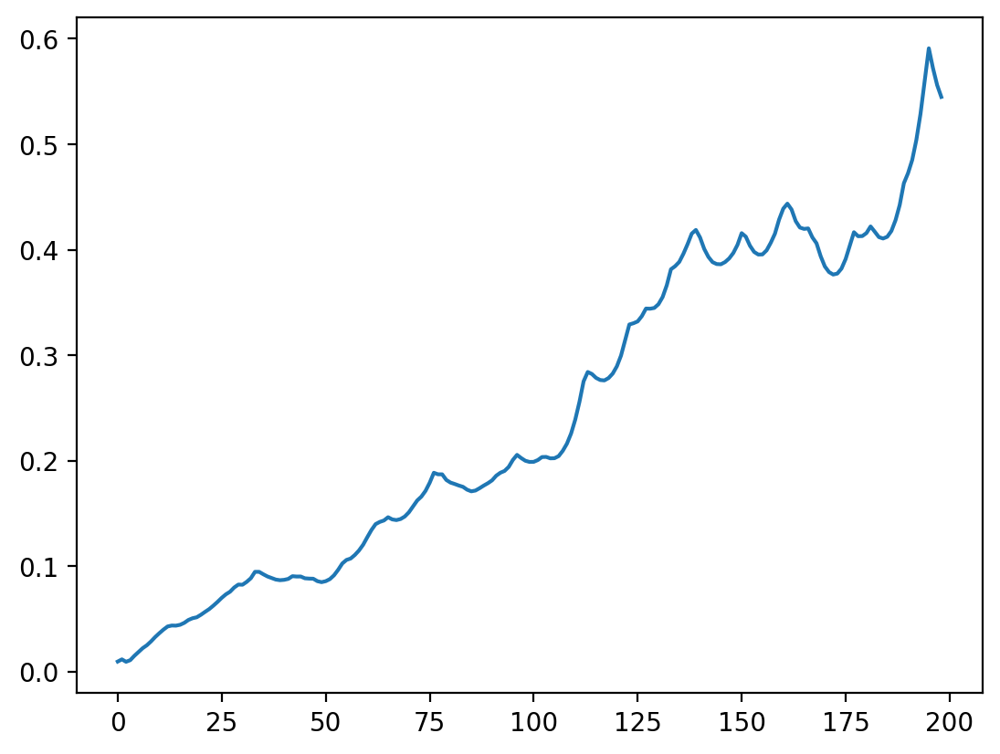

In [23]:
plt.plot(mean_dist_to_gt.min(axis=0));

In [54]:
argmax = lambda array : tuple([int(val)  for val in np.unravel_index(array.argmax(), array.shape)])  # returns a multi-dim. index pinpointing the exact elemnt in a multi-dim. array that is maximal.
mxidx = (argmax(mean_dist_to_gt))
print(mxidx)

(999, 28)


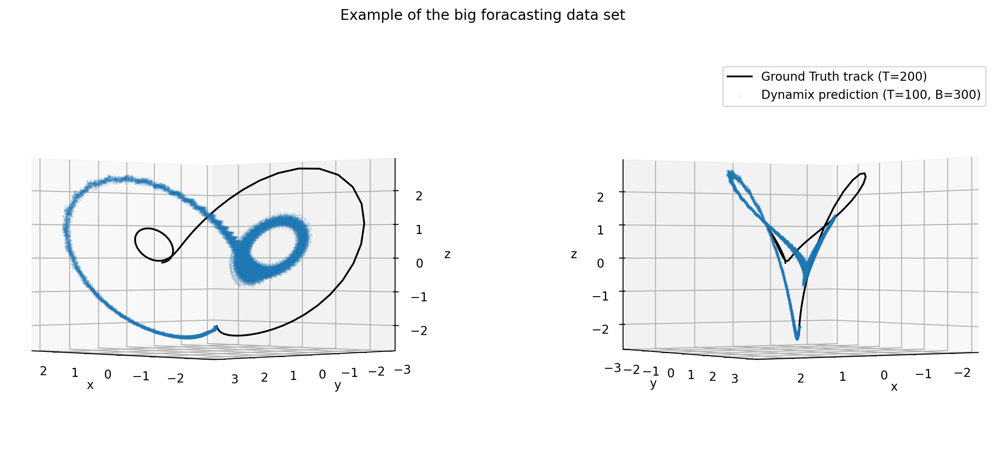

In [58]:
fig=plt.figure(figsize=(16, 6))
fig.suptitle("Example of the big foracasting data set")

T_plt = 100
idx = mxidx[0]
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[idx, :T_plt].T, 'k', label='ground truth track (T=200)')
#ax.scatter(*gt_tracks[0, :T_plt].T, c='k', s=1, label='ground truth track (T=200)')
ax.scatter(*X_Data[idx, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[idx, :T_plt].T, 'k', label='Ground Truth track (T=200)')
ax.scatter(*X_Data[idx, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1, label='Dynamix prediction (T=100, B=300)')

plt.legend()
plt.show()

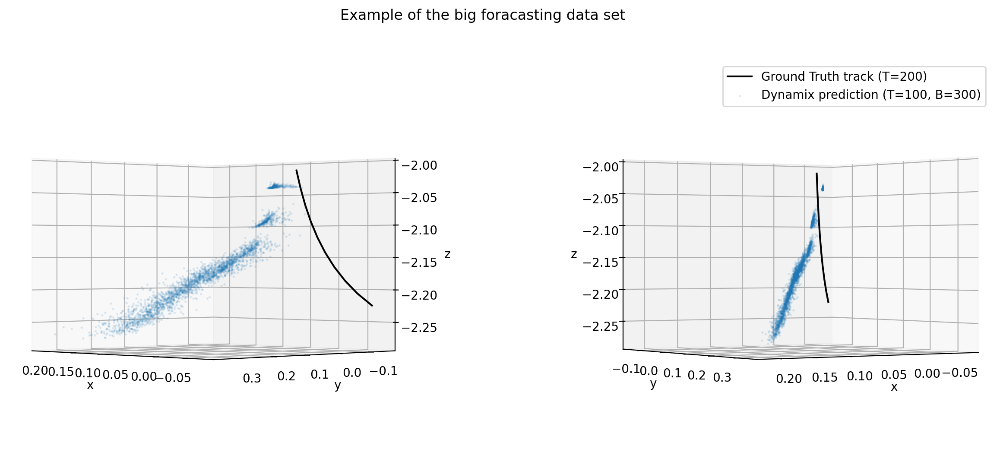

In [57]:
fig=plt.figure(figsize=(16, 6))
fig.suptitle("Example of the big foracasting data set")

T_plt = 10
idx = mxidx[0]
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[idx, :T_plt].T, 'k', label='ground truth track (T=200)')
#ax.scatter(*gt_tracks[0, :T_plt].T, c='k', s=1, label='ground truth track (T=200)')
ax.scatter(*X_Data[idx, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.plot(*gt_tracks[idx, :T_plt].T, 'k', label='Ground Truth track (T=200)')
ax.scatter(*X_Data[idx, :T_plt].reshape(-1, 3).T, s=1, alpha=0.1, label='Dynamix prediction (T=100, B=300)')

plt.legend()
plt.show()

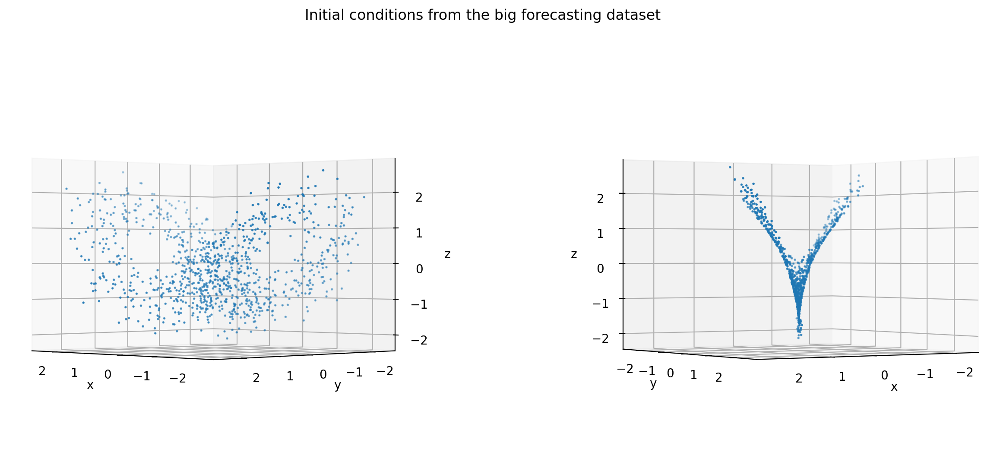

In [41]:
fig=plt.figure(figsize=(16, 6))
fig.suptitle("Initial conditions from the big forecasting dataset")

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.view_init(elev=0, azim=135, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.scatter(*initial_conditions.T, s=1)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.view_init(elev=0, azim=57, roll=0)
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
ax.scatter(*initial_conditions.T, s=1)

plt.show()

#### Creating a big short-term-forecasting dateset
Result:
- `predictions/lorenz63_big_forecasting_dataset.npz`

returns:
- I=1000 initial conditions (I, 3)
    - taken in T=200 intervals from a new dysts_220k GT
- DS of Dyn. predictions (I, T=200, B=300, 3)
- DS of Dyn. randomness used (same size as pred. DS)
- DS of GT simulations for each ic. (I, T, 3)

In [5]:
# Creating the 1000 initial conditions
print(gt_file_name)
T_gt = gt_sim.shape[0]
T = 200
init_indices = np.arange(0, T_gt, T)
I = len(init_indices)
print(I)
print()

# Repackaging the GT as 1000 sim.s
gt_tracks = gt_sim.reshape(I, -1, 3)
print(gt_tracks.shape)
initial_conditions = gt_tracks[:, 0]
print(initial_conditions.shape)
print()

# Creating 1000x300 Dynamix prediction on these tracks
B = 300   # batch size
ctx_file = "test_data/lorenz63_dysts_best_10k_context.npy"
context = np.load(ctx_file)
context_batch = context[:, None].repeat(B, axis=1)
print(context_batch.shape)
initial_condition_batch = initial_conditions[:, None].repeat(B, axis=1)
print(initial_condition_batch.shape)

test_data/lorenz63_dysts_220k
1000

(1000, 200, 3)
(1000, 3)

(10000, 300, 3)
(1000, 300, 3)


In [7]:
Z_Data = np.zeros((I, T, B, model.M))
Att_Noise = np.random.normal(size=(I, T, B, 3))
for i in tqdm(range(I), position=-1):
    Z_Data[i] = forecaster.forecast_att_post2(T, context_batch, Att_Noise[i], 
        initial_condition_batch[i]).detach().numpy()
X_Data = Z_Data[...,:3] * context.std() + context.mean()   # unstandardize Z-data to GT standard.



100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 16.92it/s]

100%|█████████████████████████████████████████| 200/200 [00:12<00:00, 16.37it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.70it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.56it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.08it/s]

100%|█████████████████████████████████████████| 200/200 [00:12<00:00, 16.40it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.36it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.42it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.28it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.63it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.75it/s]

100%|█████████████████████████████████████████| 200/200 [00:11<00:00, 17.42it/s]

100%|██████████

NameError: name 'Z' is not defined